In [1]:
from PIL import Image, ImageDraw, ImageFont
from os import listdir
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import cv2
from skimage.feature import hog
import os
from tqdm import tqdm
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from IPython.display import SVG
from keras.utils import np_utils
import tensorflow as tf

In [2]:
fontsize = 50
font = ImageFont.truetype('Noto_Sans_JP/static/NotoSansJP-Regular.ttf', fontsize)

In [3]:
df_train = pd.read_csv('train.csv')
unicode_map = {codepoint: char for codepoint, char in pd.read_csv('unicode_translation.csv').values}
unicode_map

{'U+0031': '1',
 'U+0032': '2',
 'U+0034': '4',
 'U+0036': '6',
 'U+0039': '9',
 'U+003F': '?',
 'U+2000B': '𠀋',
 'U+20D45': '𠵅',
 'U+2123D': '𡈽',
 'U+22999': '𢦙',
 'U+22CE3': '𢳣',
 'U+231C3': '𣇃',
 'U+2324A': '𣉊',
 'U+233D0': '𣏐',
 'U+23D0E': '𣴎',
 'U+241C6': '𤇆',
 'U+242CE': '𤋎',
 'U+2437D': '𤍽',
 'U+24E30': '𩹵',
 'U+24E60': '𤹠',
 'U+24FA3': '𤾣',
 'U+2564A': '𩹵',
 'U+25750': '𥝐',
 'U+25877': '𥡷',
 'U+25A0': '■',
 'U+25A1': '□',
 'U+25B2': '▲',
 'U+25B3': '△',
 'U+25CB': '○',
 'U+25CF': '●',
 'U+25DA1': '𥶡',
 'U+25E2E': '𥸮',
 'U+25EF': '◯',
 'U+25FFB': '𥿻',
 'U+264B3': '𦒳',
 'U+266B0': '𦚰',
 'U+27752': '𧝒',
 'U+28263': '𩹵',
 'U+29780': '𩞀',
 'U+29DDA': '𩷚',
 'U+29E75': '𩹵',
 'U+3002': '。',
 'U+3005': '々',
 'U+3006': '〆',
 'U+3007': '0',
 'U+300C': '「',
 'U+300D': '」',
 'U+3031': '〱',
 'U+3032': '〲',
 'U+303B': '〻',
 'U+303D': '〽',
 'U+3042': 'あ',
 'U+3044': 'い',
 'U+3046': 'う',
 'U+3048': 'え',
 'U+304A': 'お',
 'U+304B': 'か',
 'U+304C': 'が',
 'U+304D': 'き',
 'U+304E': 'ぎ',
 'U+304F': '

In [4]:
df_train.isnull().sum()

image_id    0
labels      0
dtype: int64

In [5]:
def visualize_training_data(image_fn, labels):
    labels = np.array(labels.split(' ')).reshape(-1, 5)
    imsource = Image.open(image_fn).convert('RGBA')
    bbox_canvas = Image.new('RGBA', imsource.size)
    char_canvas = Image.new('RGBA', imsource.size)
    bbox_draw = ImageDraw.Draw(bbox_canvas)
    char_draw = ImageDraw.Draw(char_canvas)

    for codepoint, x, y, w, h in labels:
        x, y, w, h = int(x), int(y), int(w), int(h)
        char = unicode_map[codepoint] 

        bbox_draw.rectangle((x, y, x+w, y+h), fill=(255, 255, 255, 0), outline=(255, 0, 0, 255))
        char_draw.text((x + w + fontsize/4, y + h/2 - fontsize), char, fill=(0, 0, 255, 255), font=font)
        Croped_image = imsource.crop((x, y, x+w, y+h))
        plt.figure()
        print(str(unicode_map[codepoint]))
        plt.imshow(Croped_image)
        plt.show()

    imsource = Image.alpha_composite(Image.alpha_composite(imsource, bbox_canvas), char_canvas)
    imsource = imsource.convert("RGB")
    return np.asarray(imsource)

ア


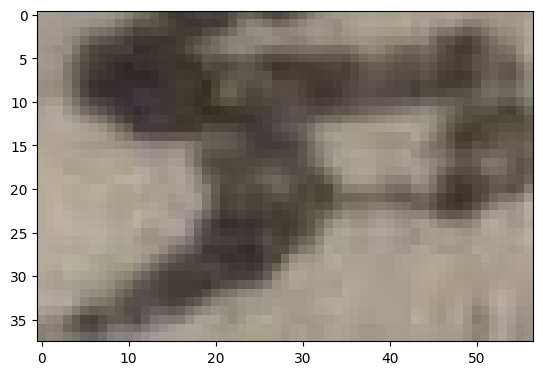

マ


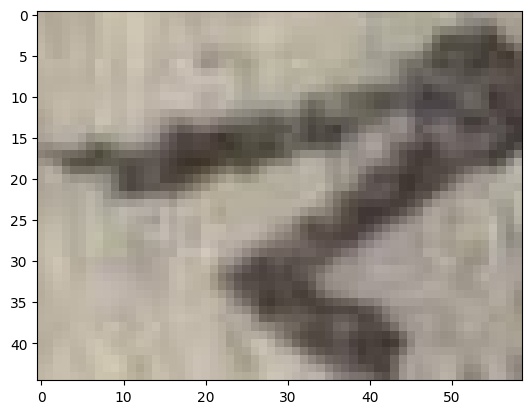

い


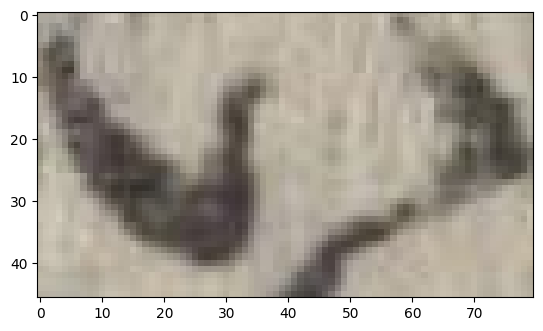

は


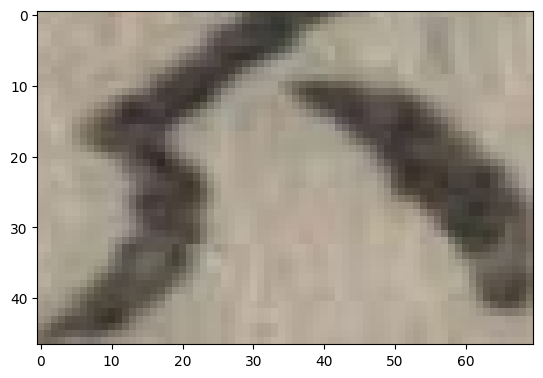

モ


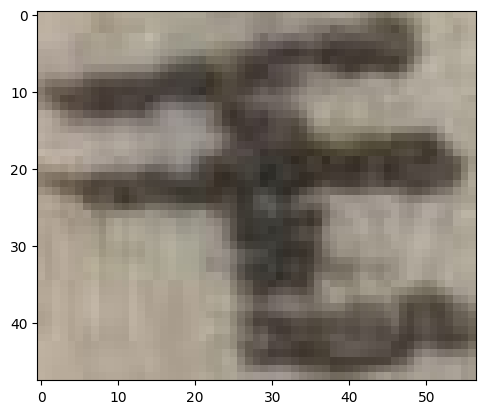

ヨ


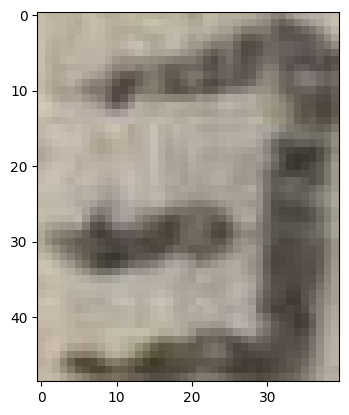

か


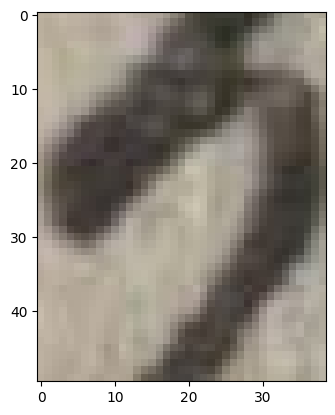

が


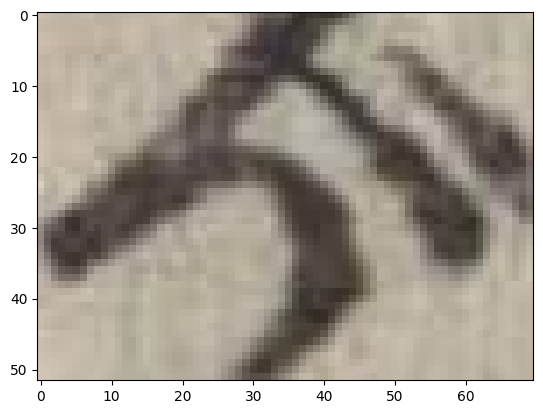

ツ


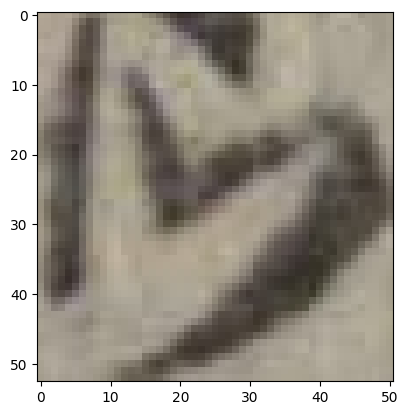

の


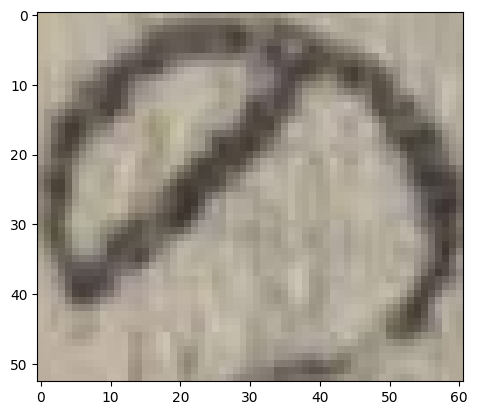

は


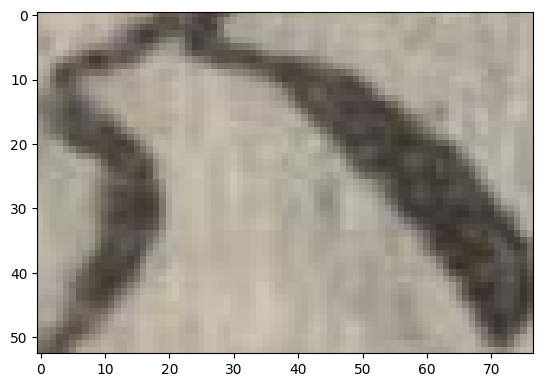

五


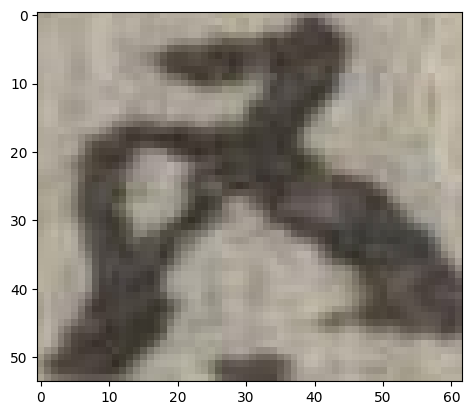

ふ


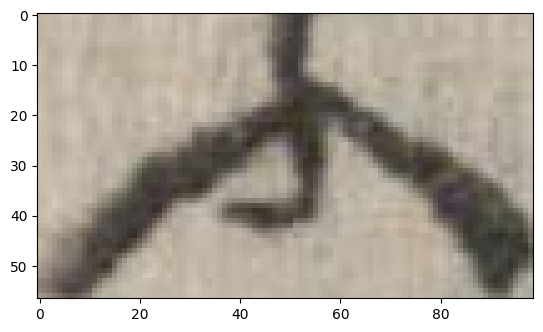

か


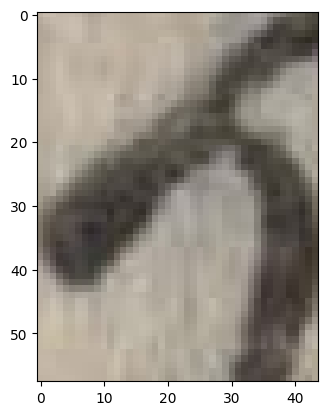

ゝ


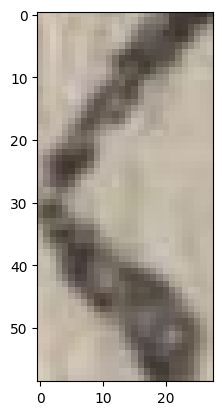

や


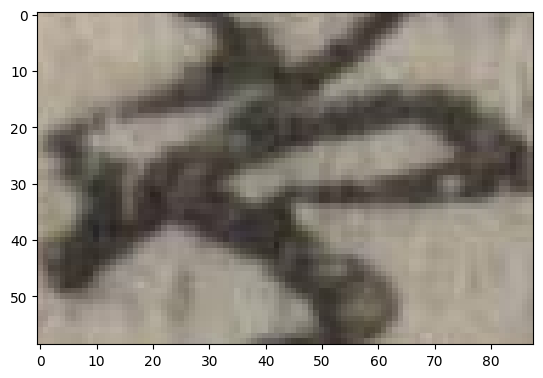

へ


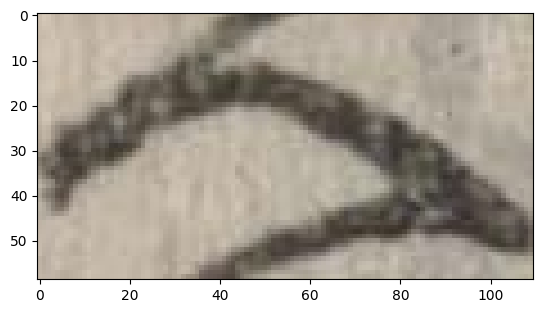

へ


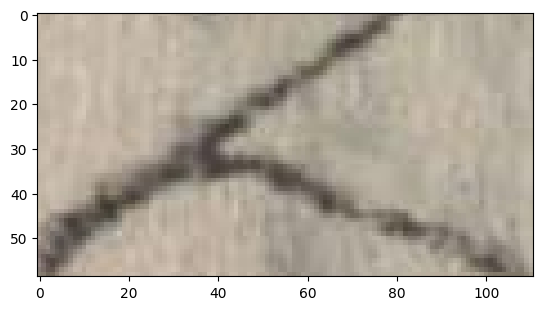

ウ


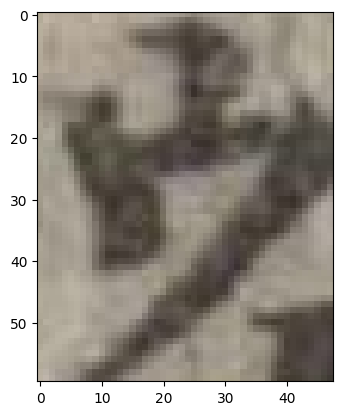

の


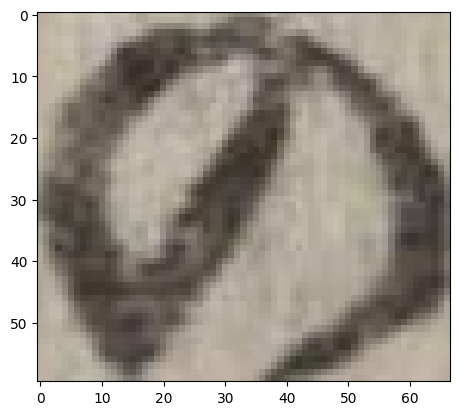

ア


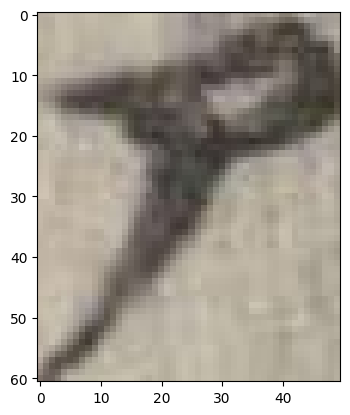

い


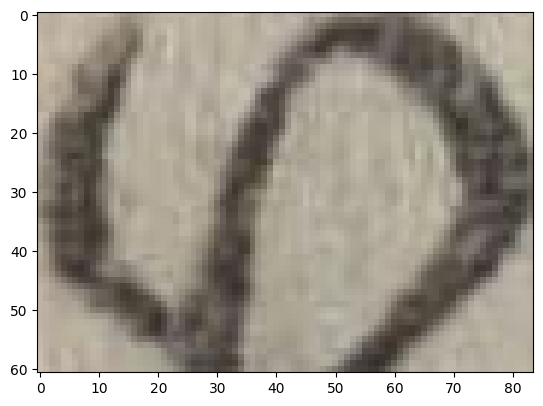

女


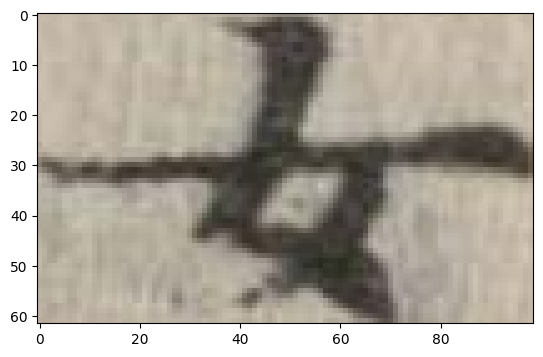

六


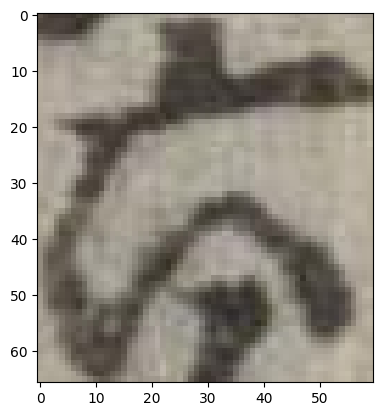

が


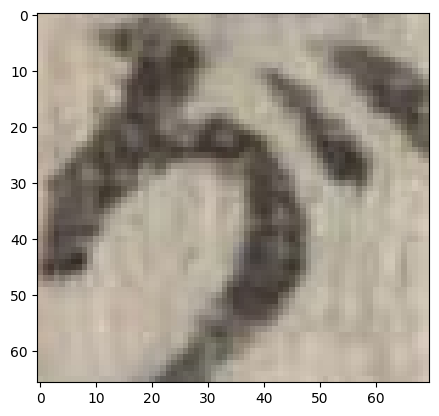

が


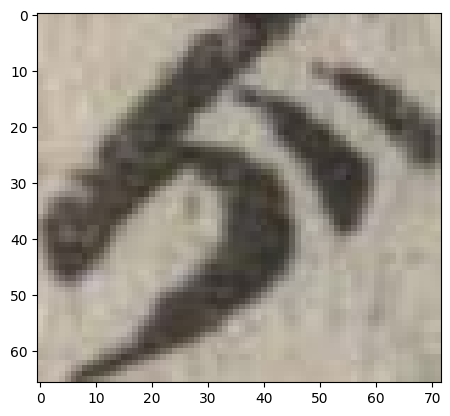

ふ


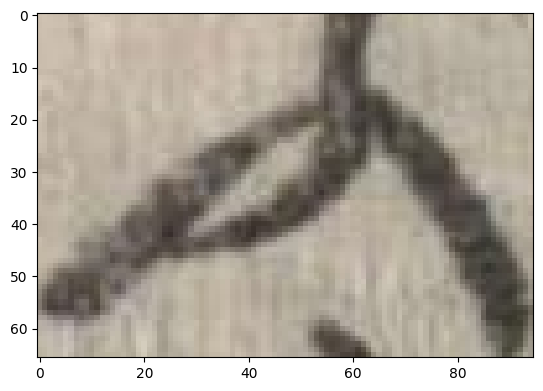

が


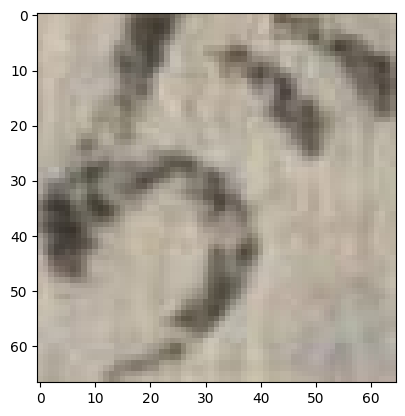

の


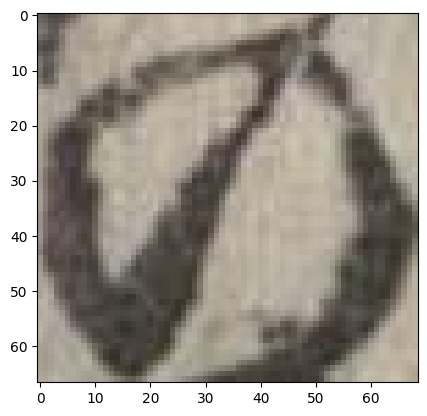

し


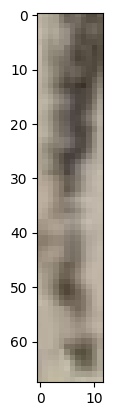

の


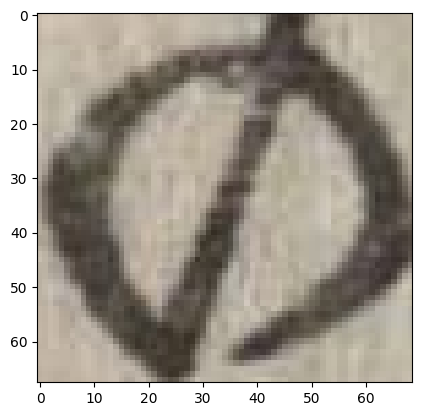

御


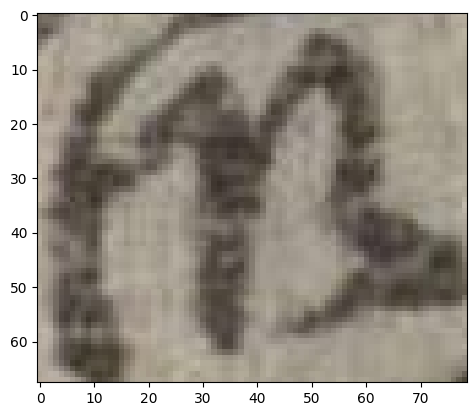

こ


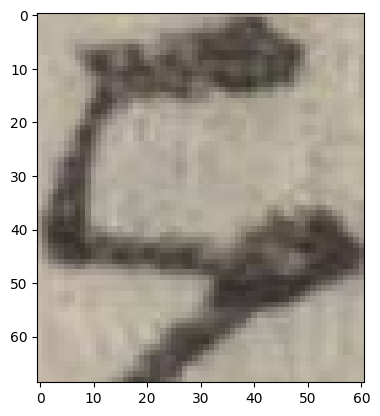

の


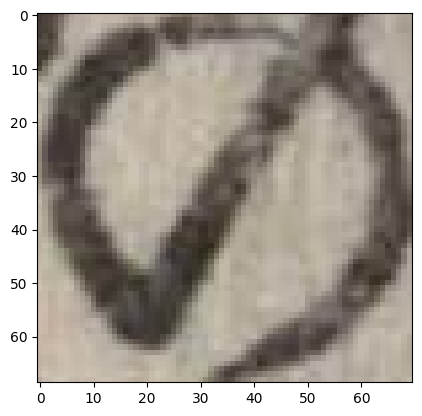

と


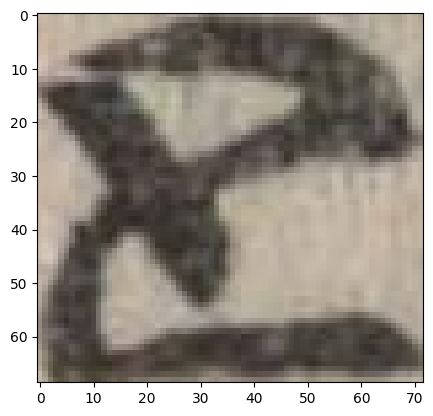

に


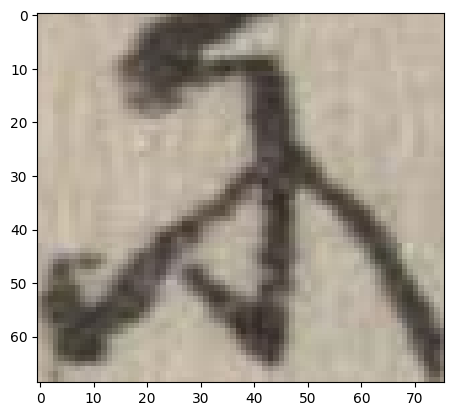

の


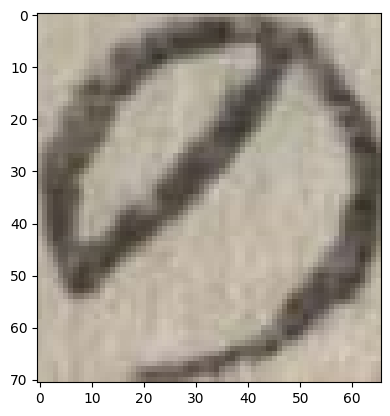

と


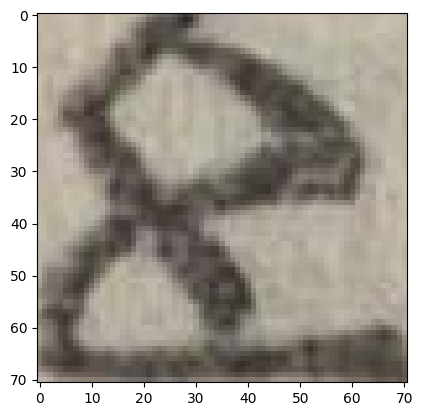

ア


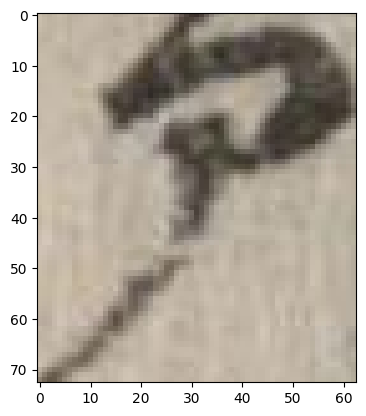

の


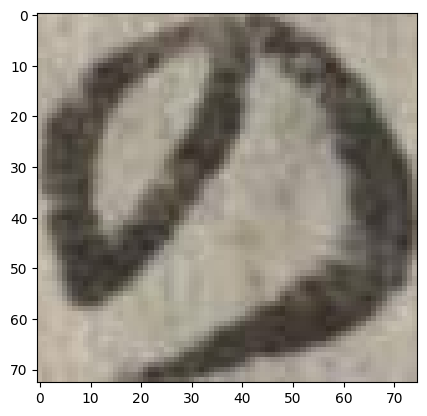

い


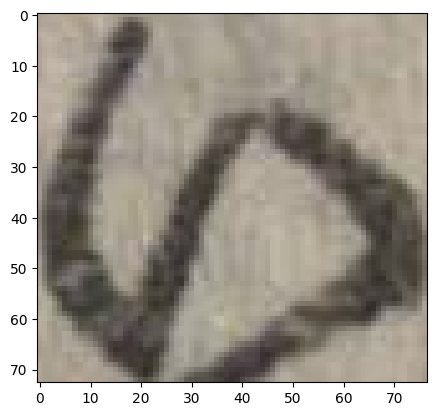

は


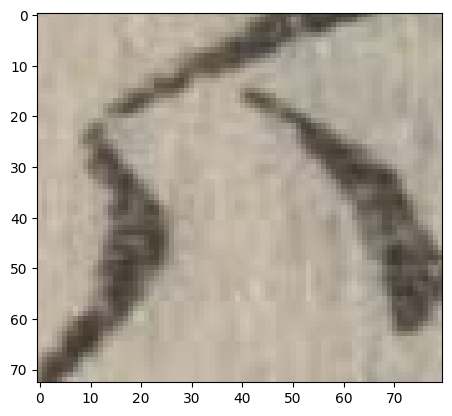

や


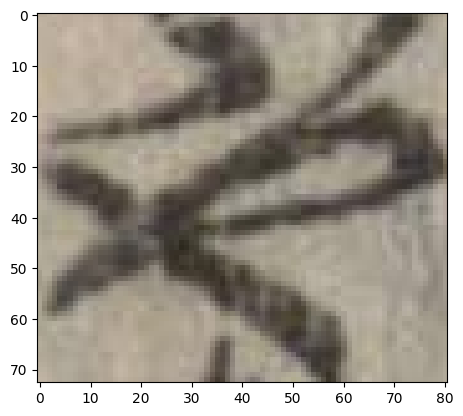

を


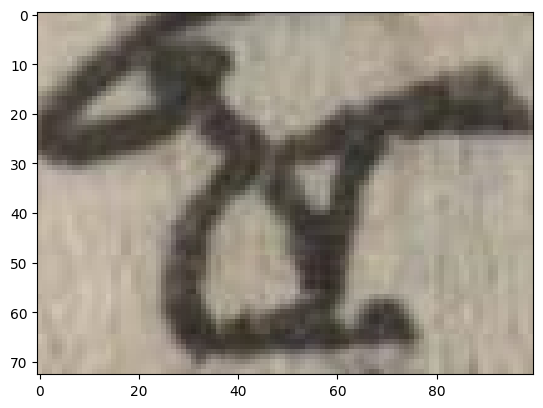

に


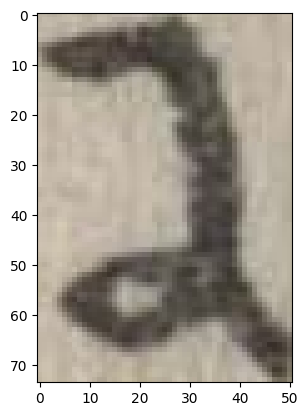

か


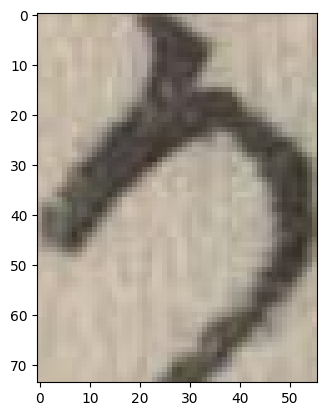

の


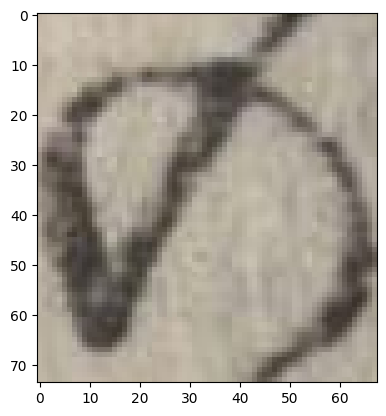

て


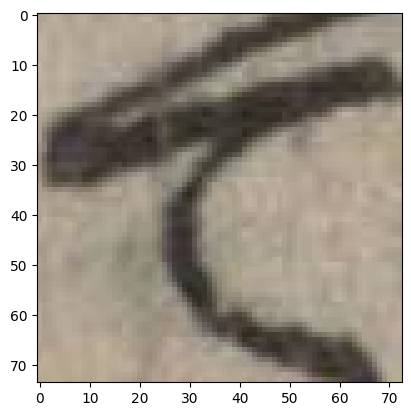

お


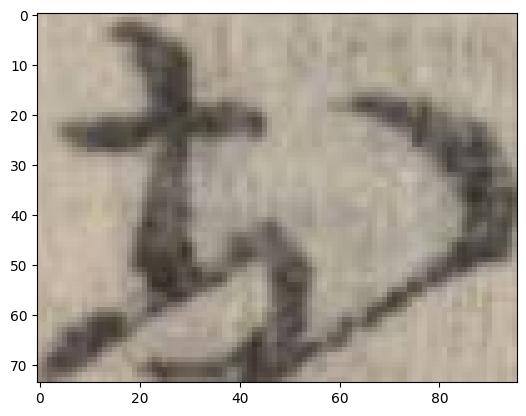

に


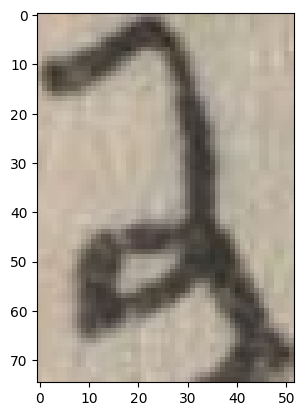

人


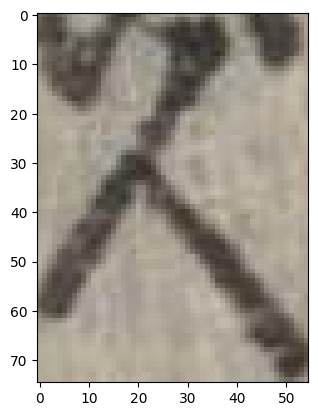

ア


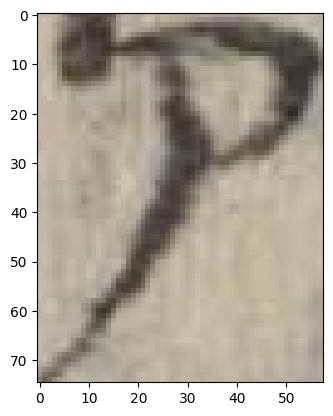

く


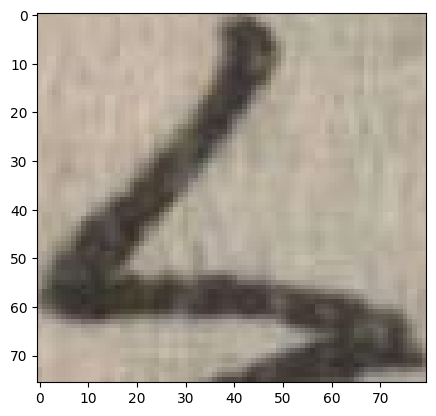

お


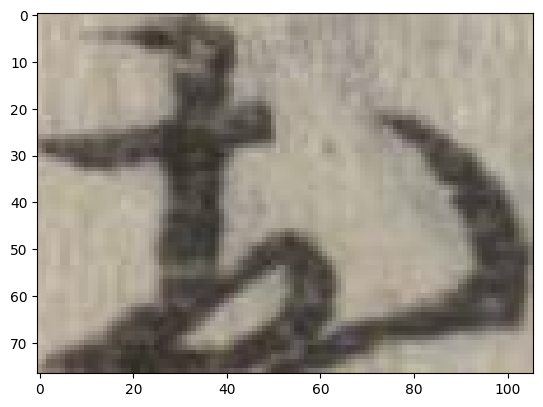

て


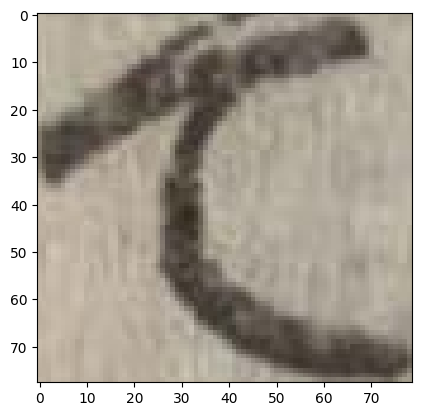

つ


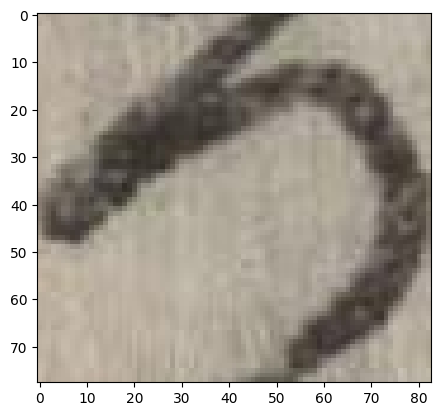

は


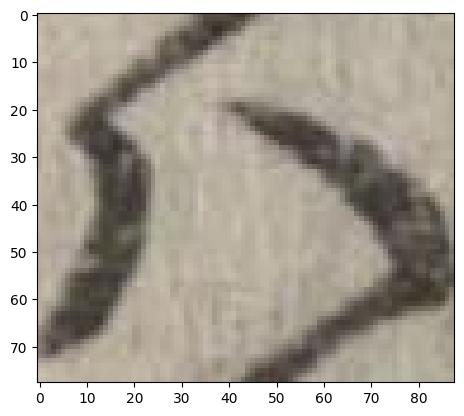

ん


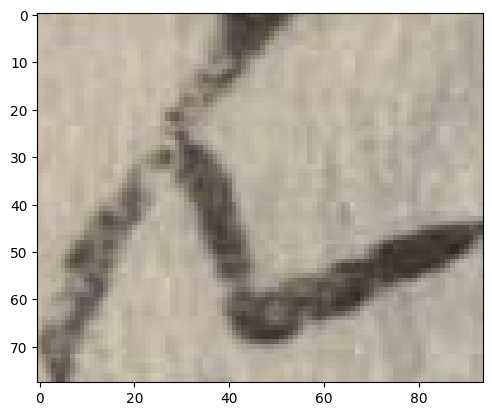

ふ


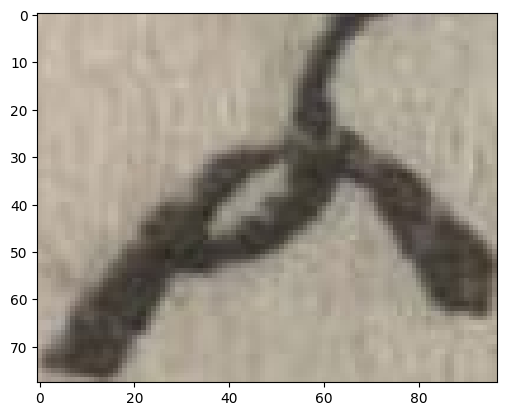

へ


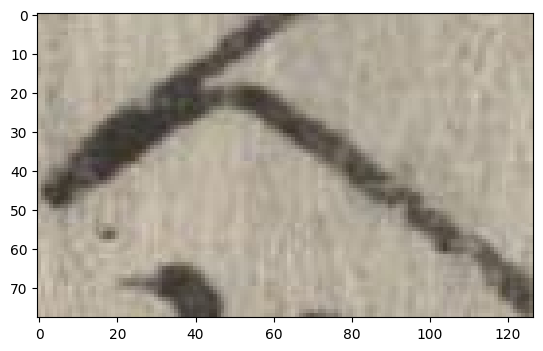

み


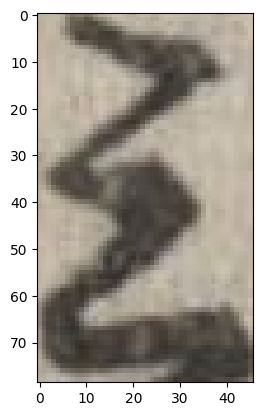

つ


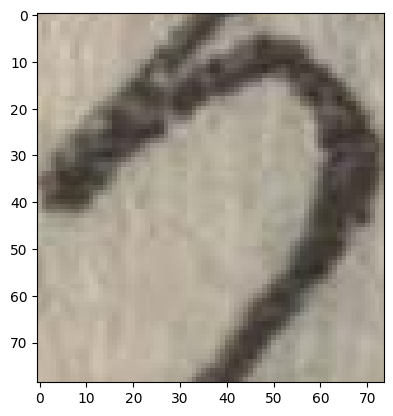

る


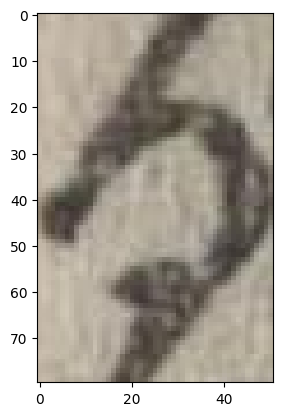

て


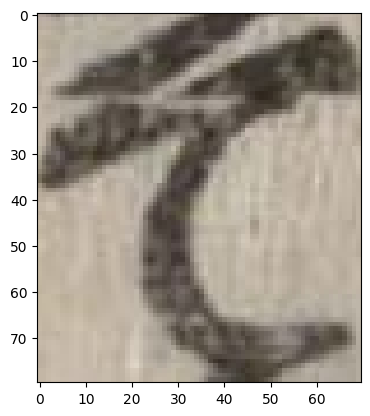

い


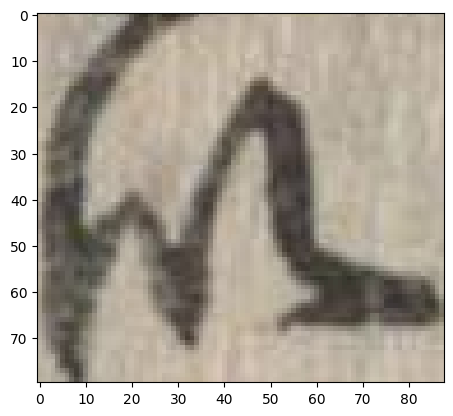

お


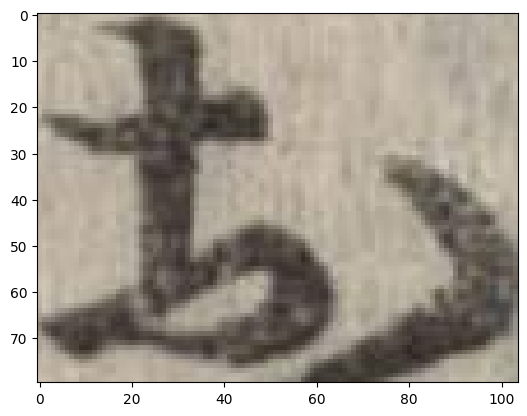

へ


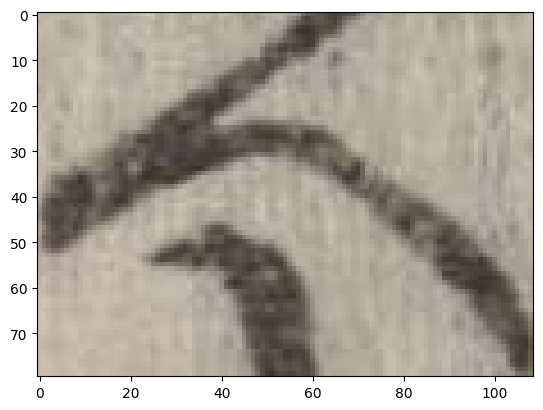

へ


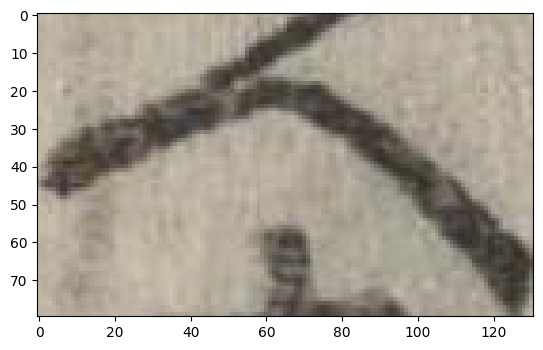

も


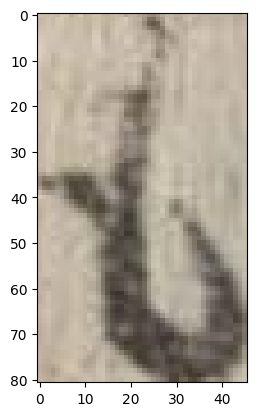

た


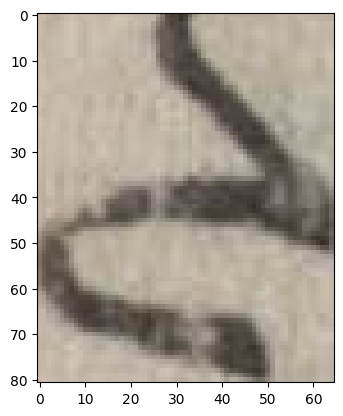

た


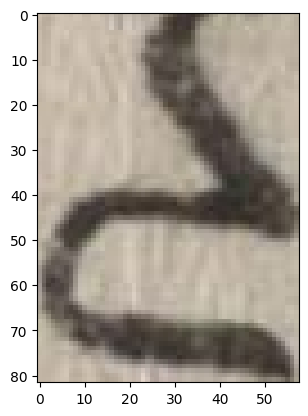

さ


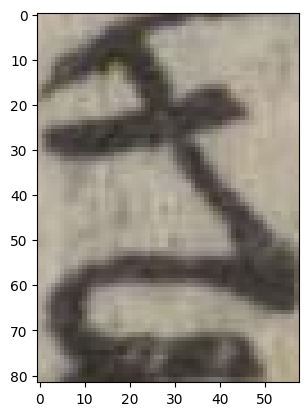

い


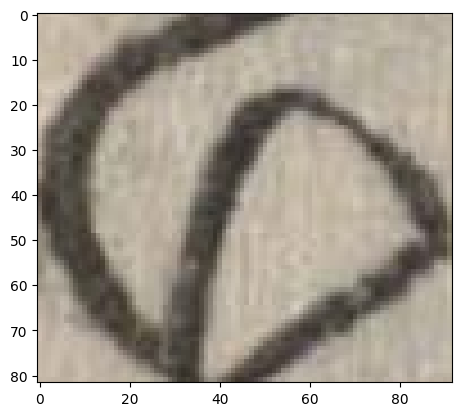

と


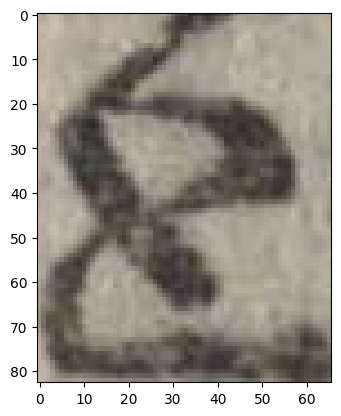

つ


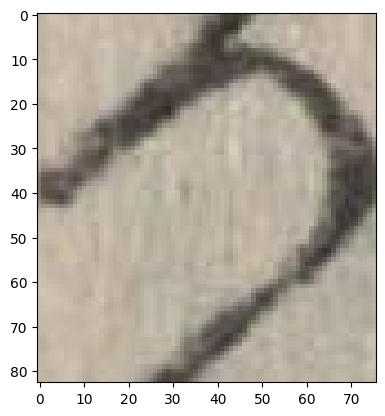

ぢ


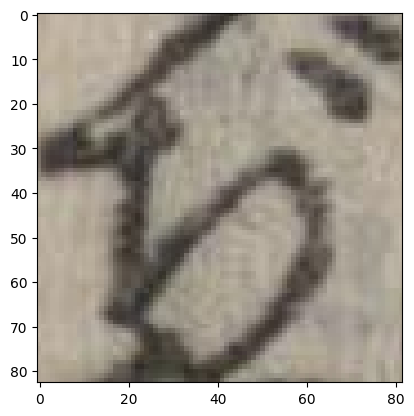

ん


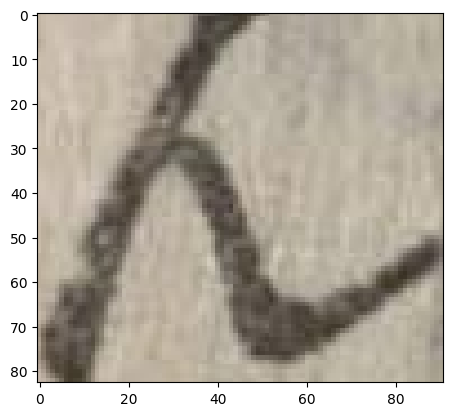

り


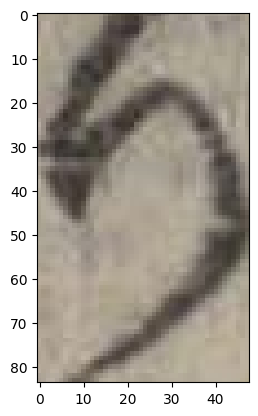

な


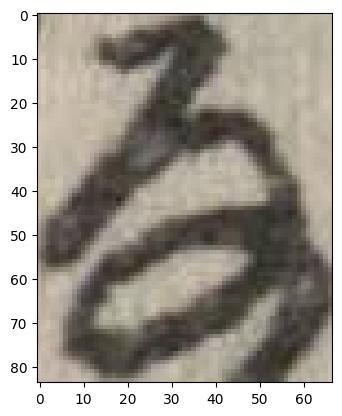

お


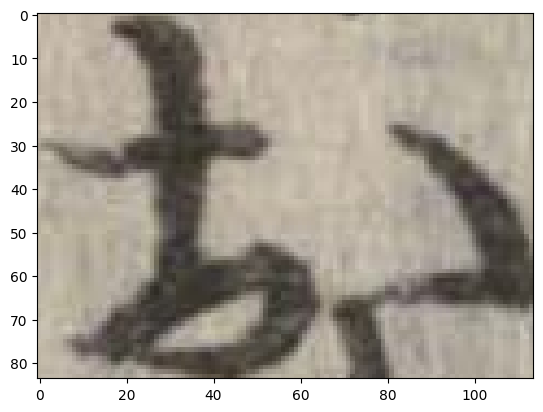

ち


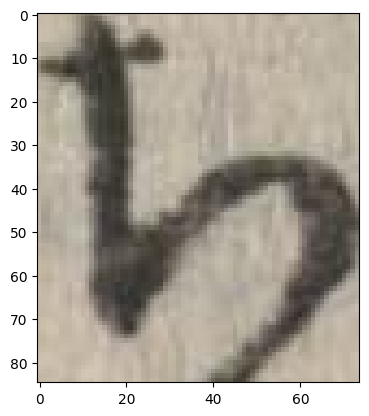

イ


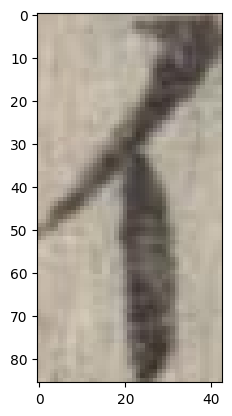

た


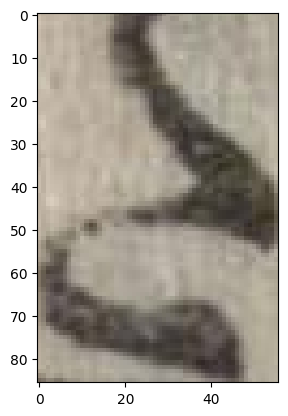

女


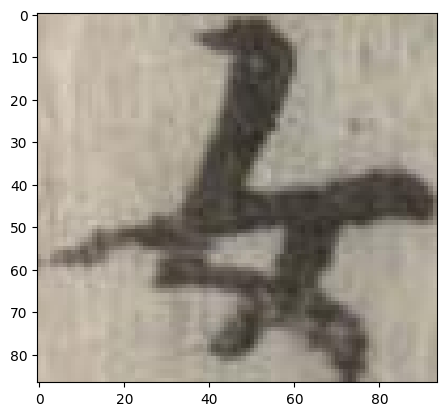

そ


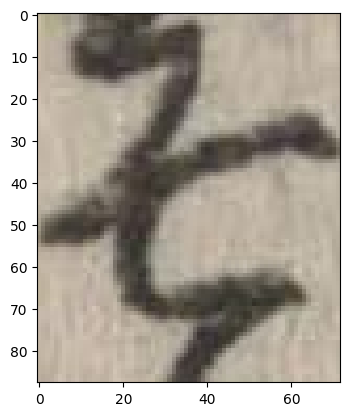

る


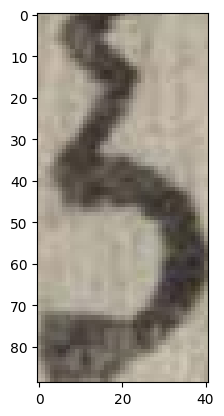

に


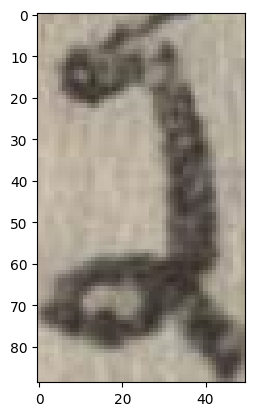

さ


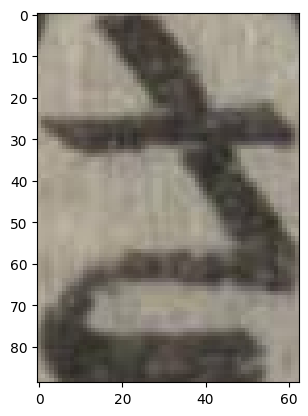

い


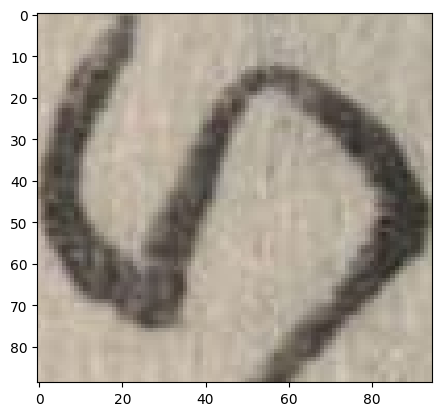

ら


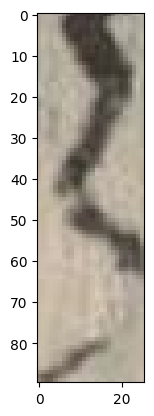

り


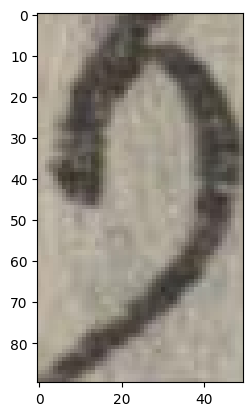

で


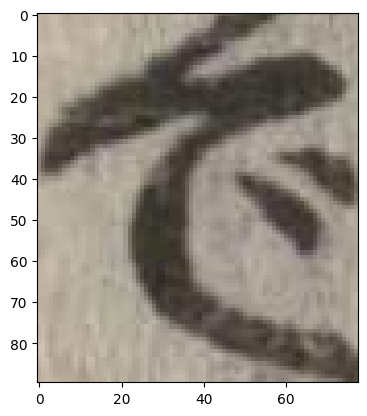

で


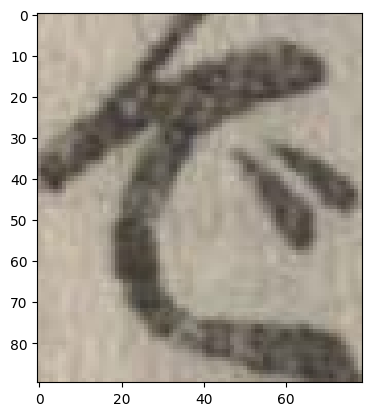

小


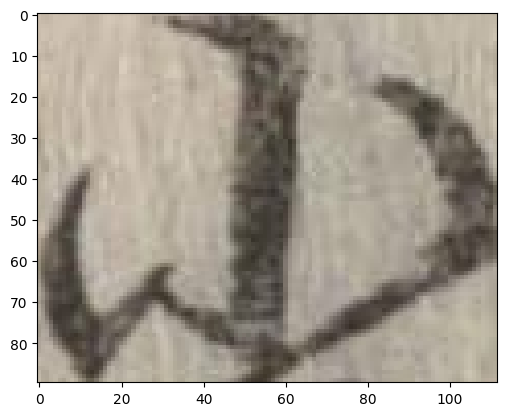

ち


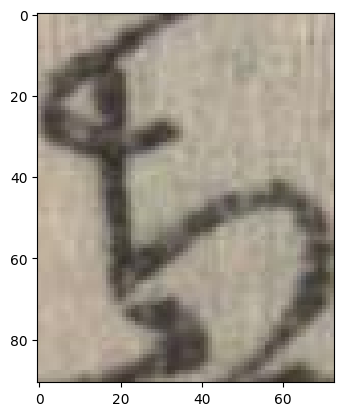

や


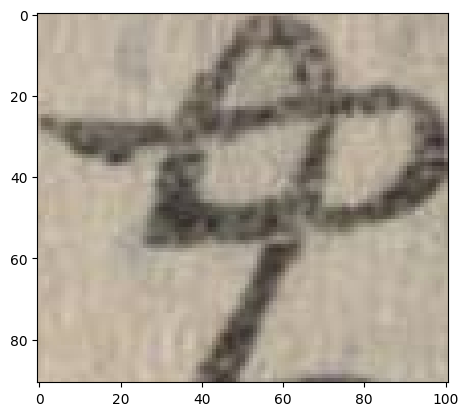

り


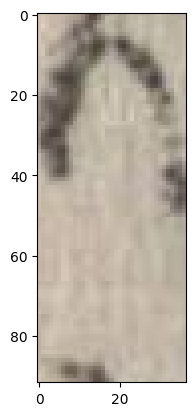

た


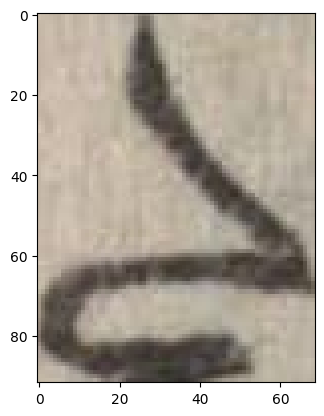

ず


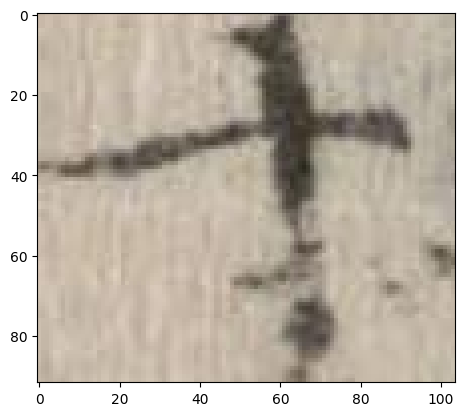

お


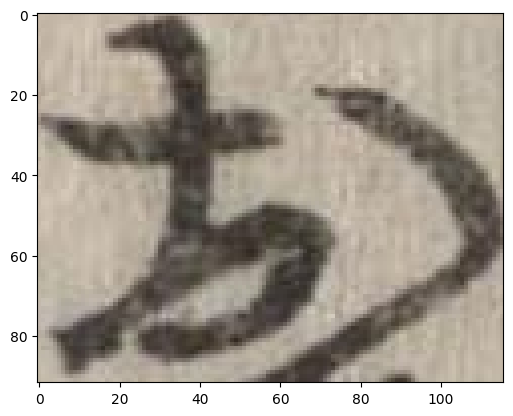

を


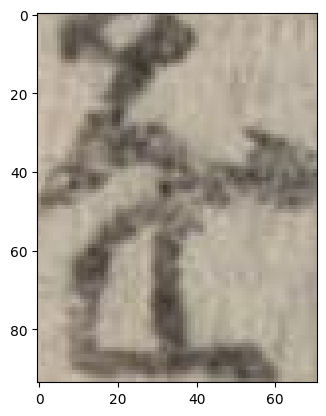

ぞ


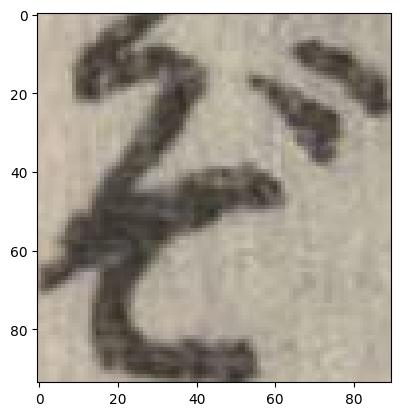

び


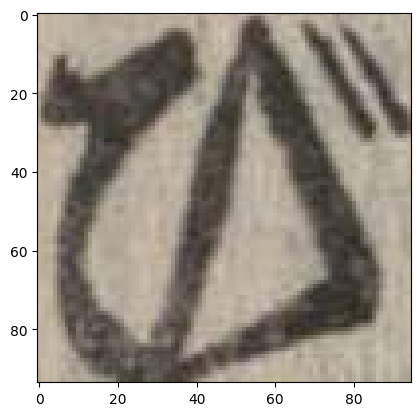

と


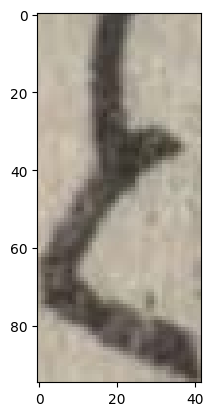

に


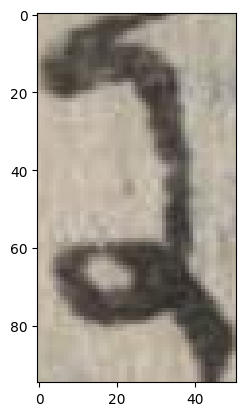

も


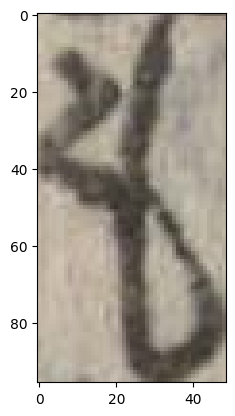

を


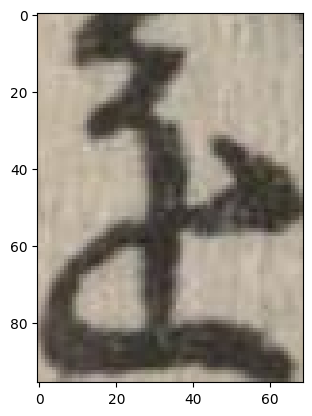

ほ


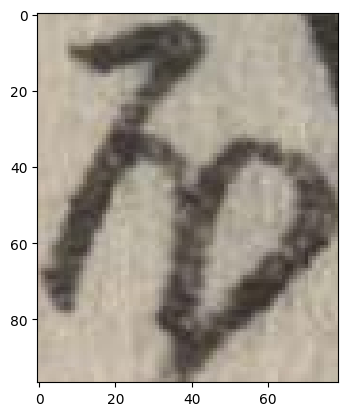

ね


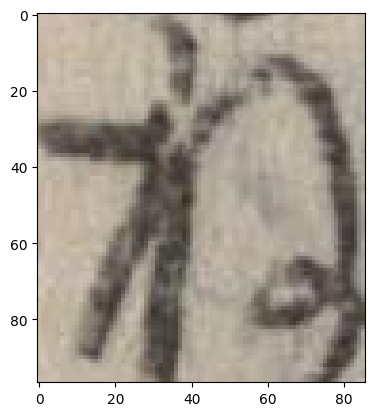

つ


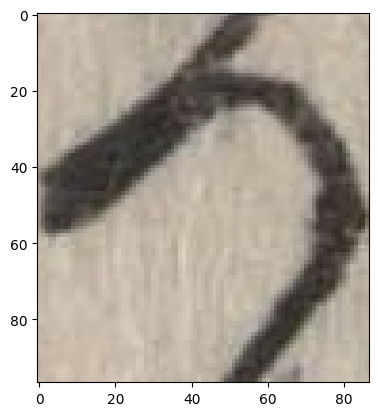

ま


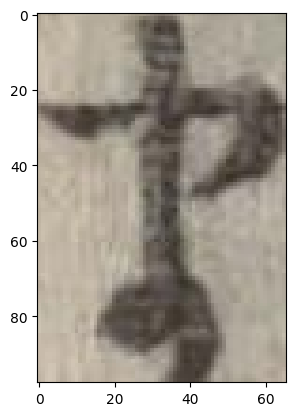

ま


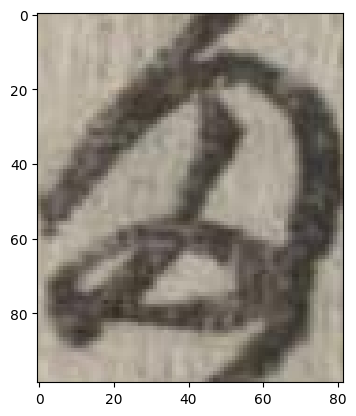

し


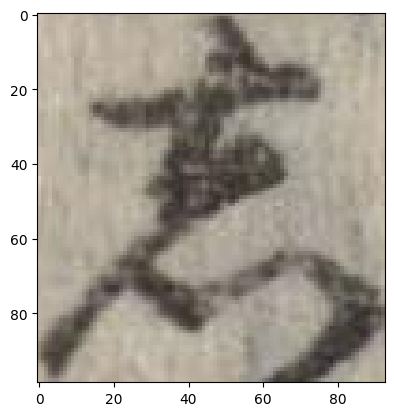

女


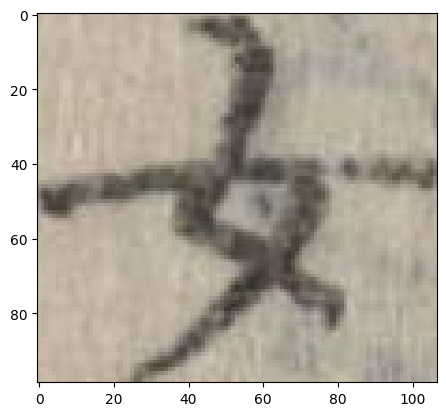

ら


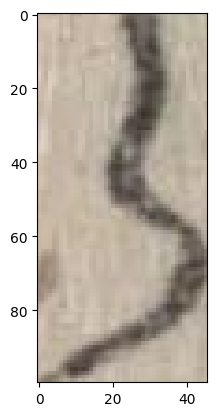

わ


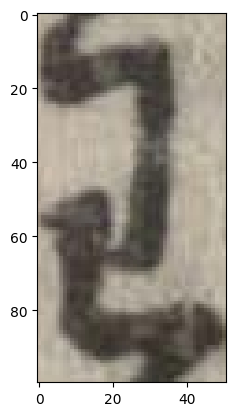

し


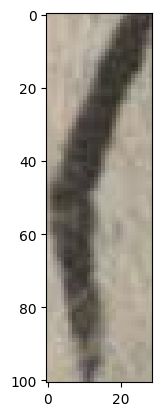

ら


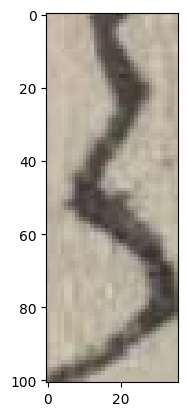

り


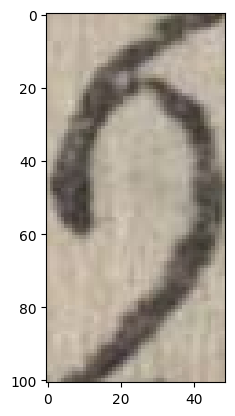

も


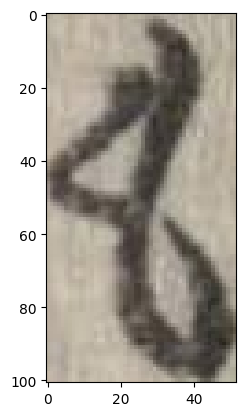

さ


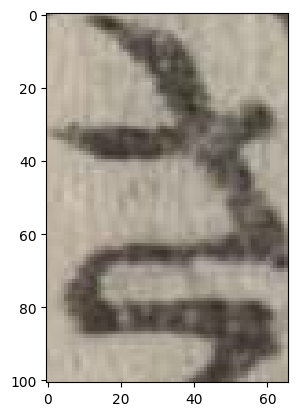

れ


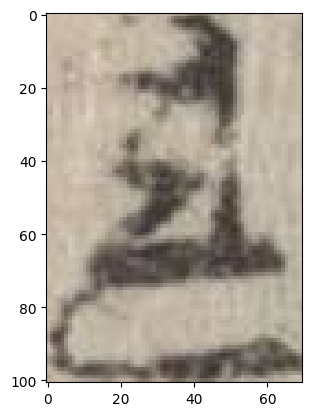

さ


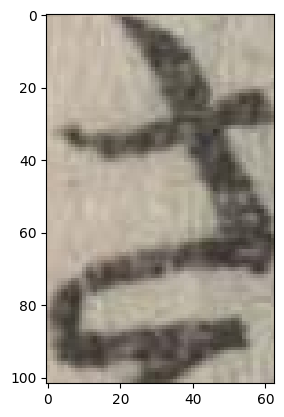

人


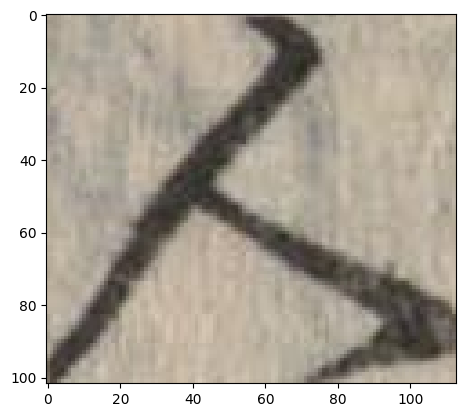

ま


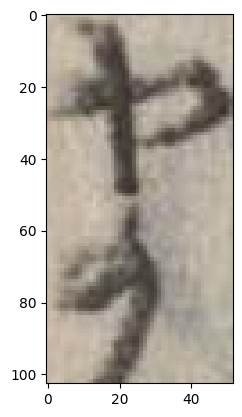

も


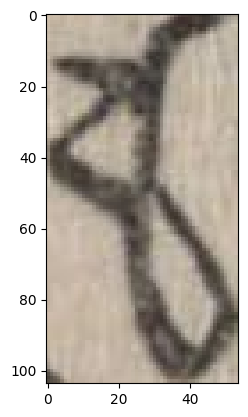

由


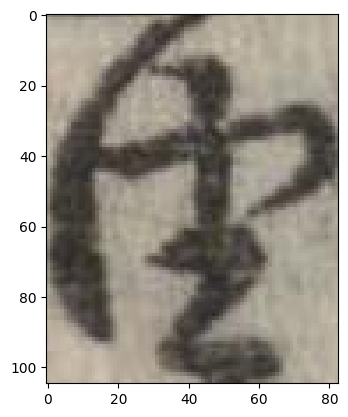

道


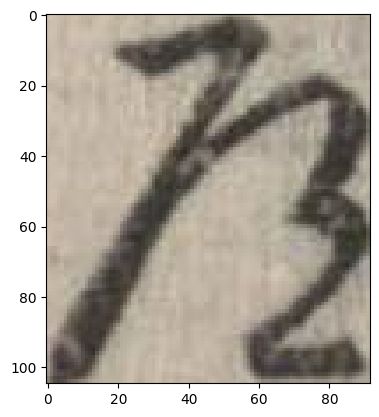

伊


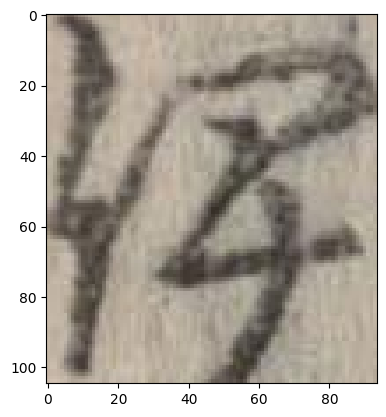

せ


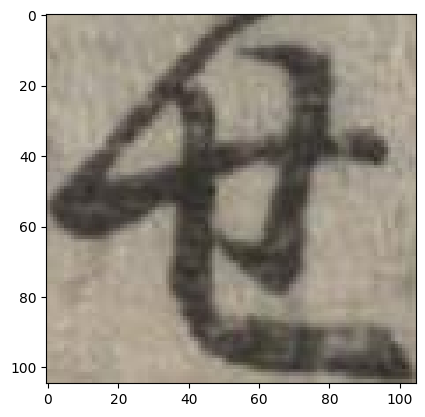

帰


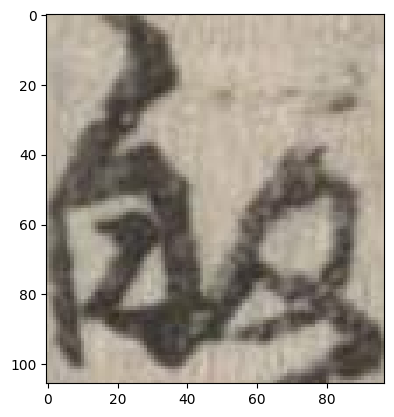

け


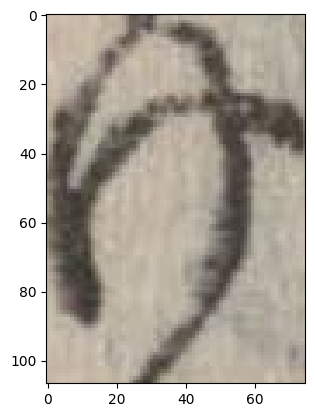

も


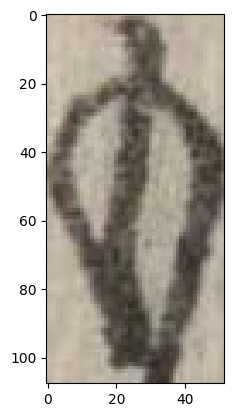

を


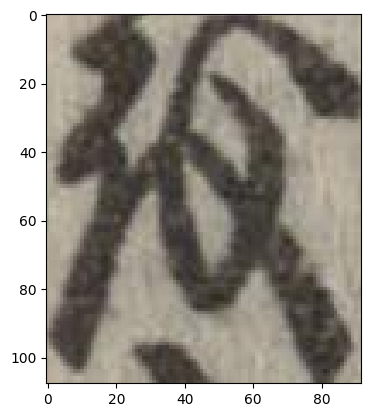

ん


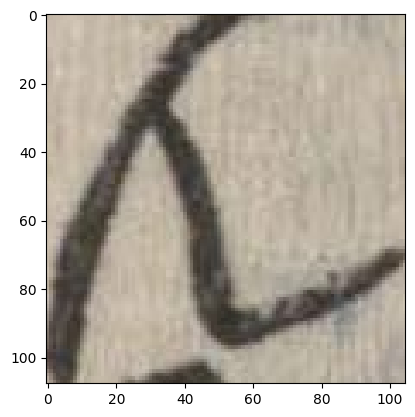

私


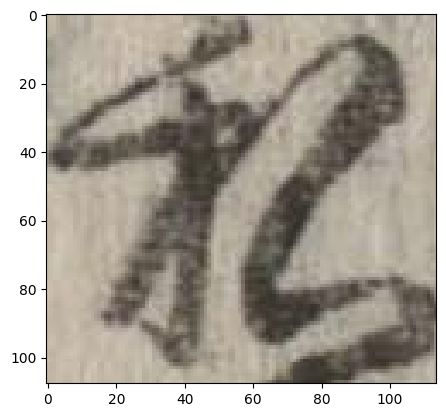

た


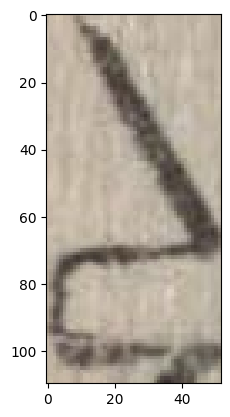

立


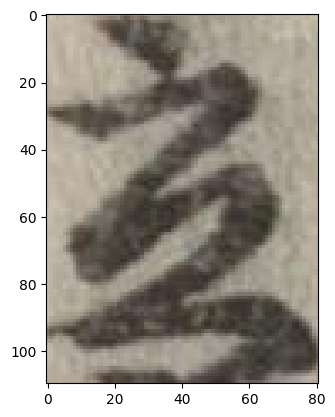

江


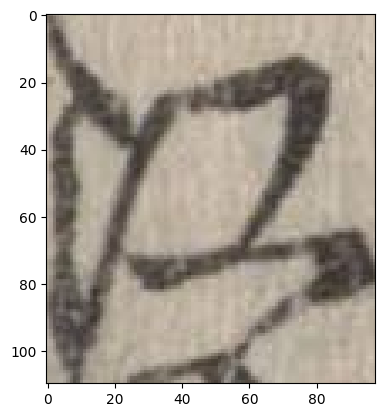

大


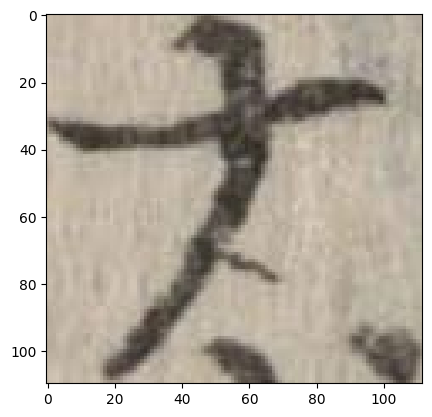

結


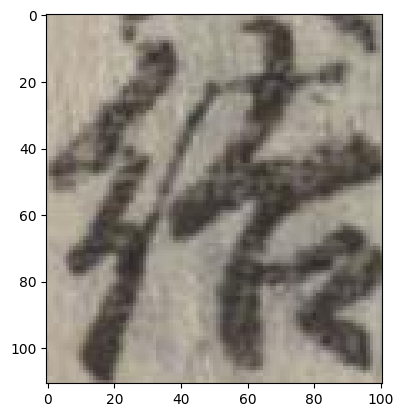

喰


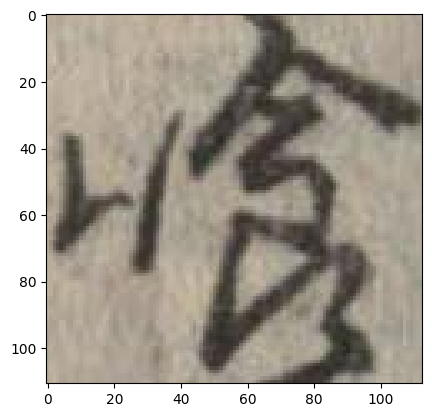

道


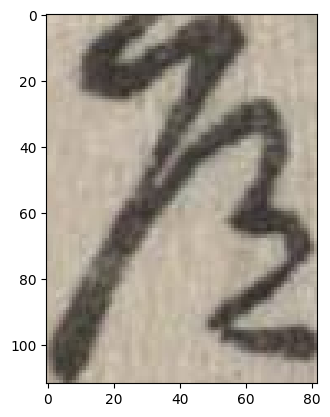

ね


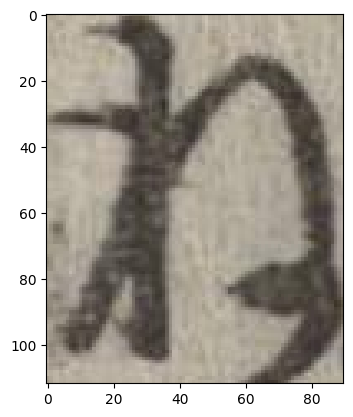

〱


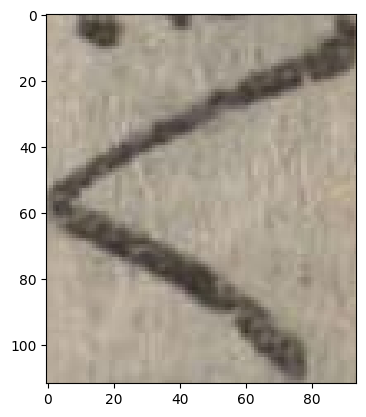

天


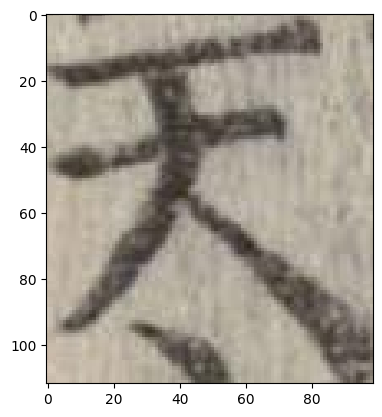

ち


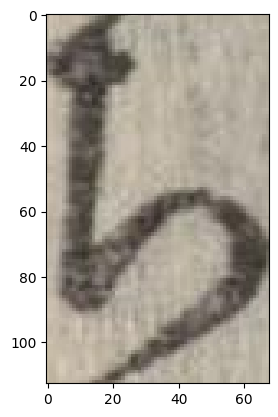

知


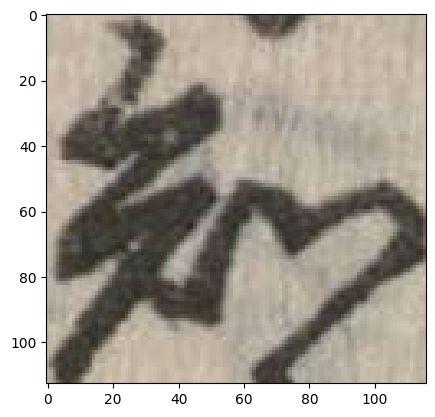

ば


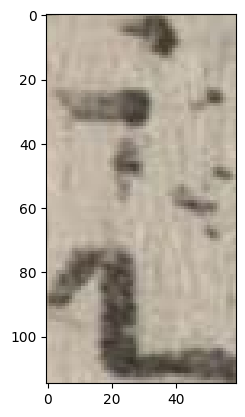

ら


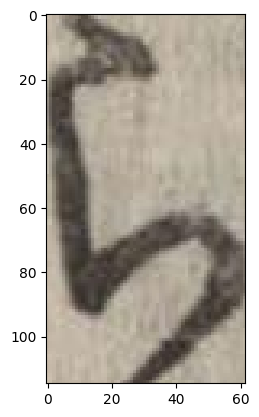

れ


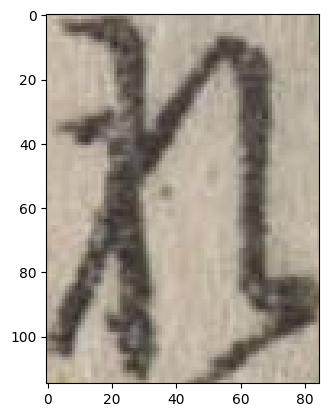

衆


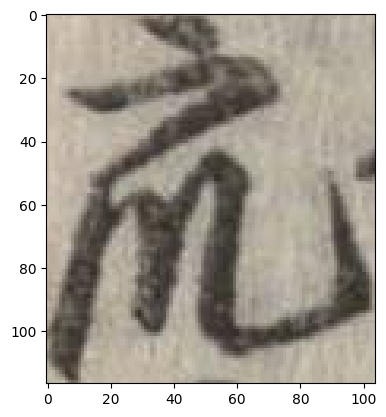

立


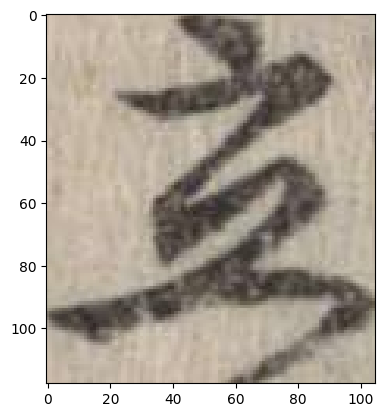

ら


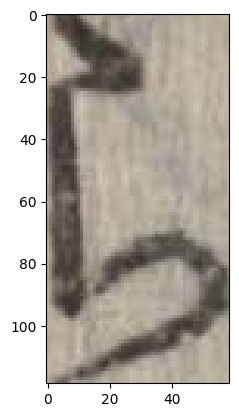

れ


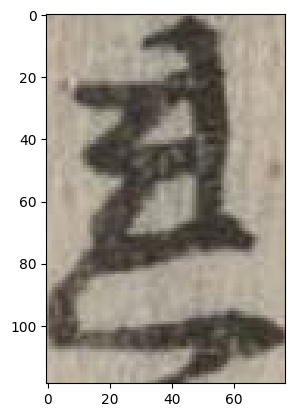

江


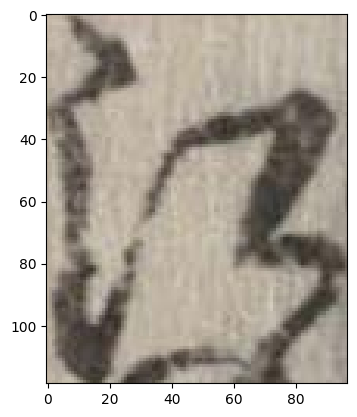

〱


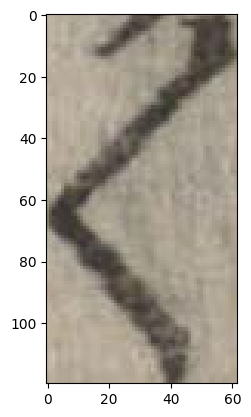

𠀋


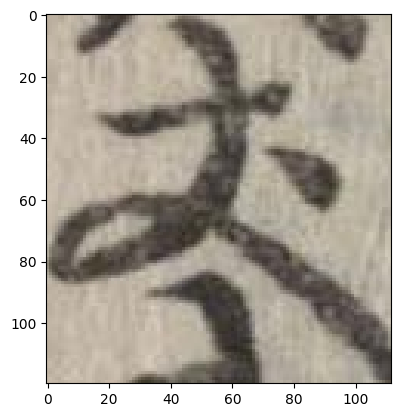

ま


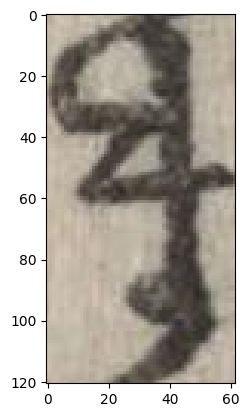

弁


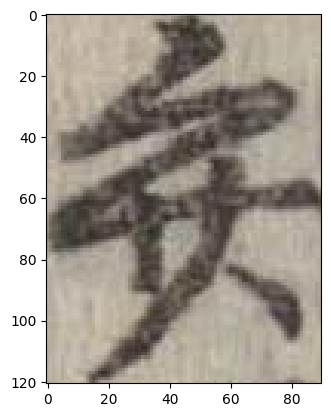

姉


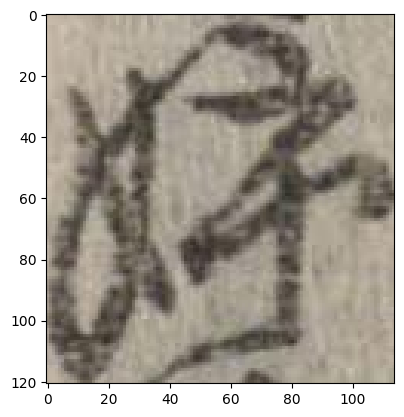

ま


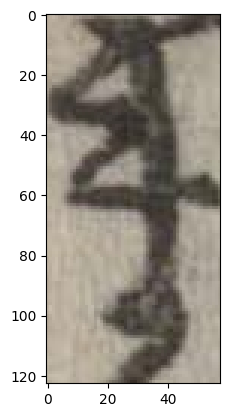

島


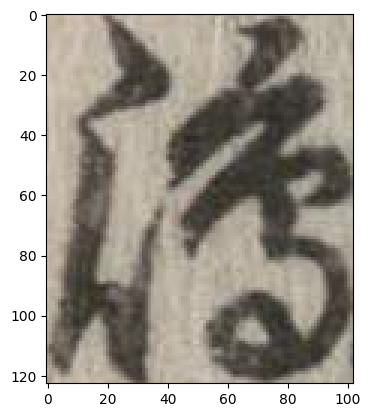

余


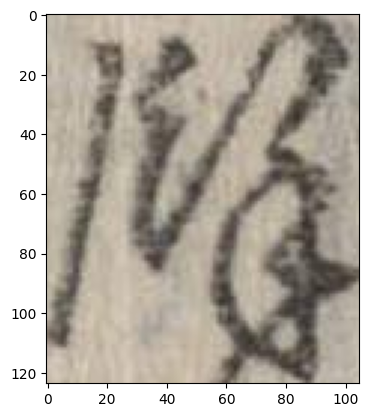

ら


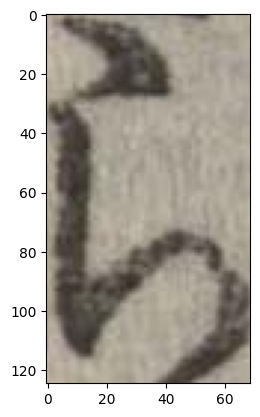

す


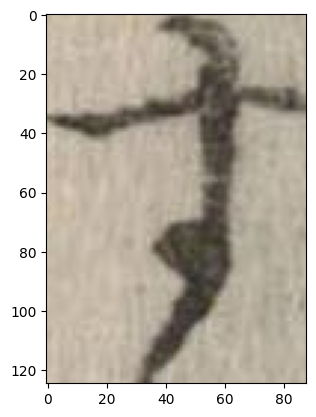

過


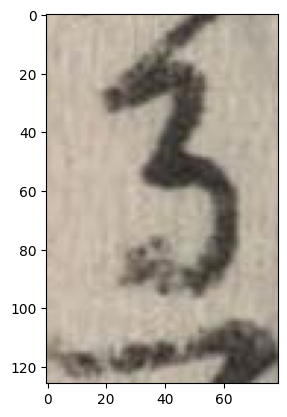

今


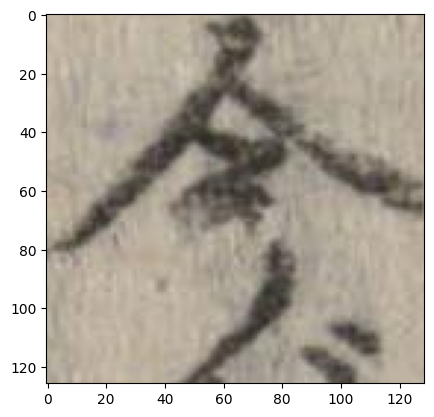

願


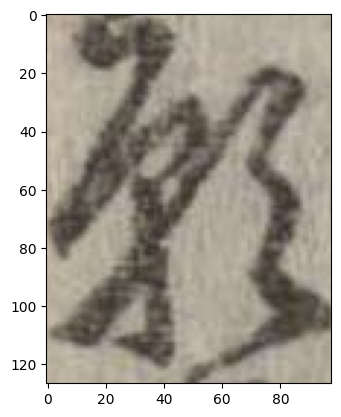

惚


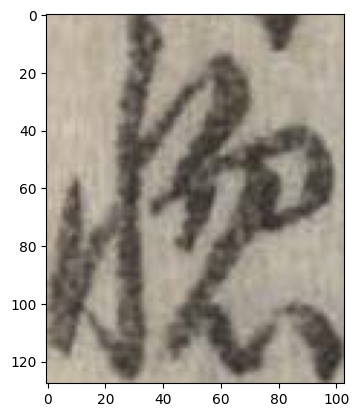

島


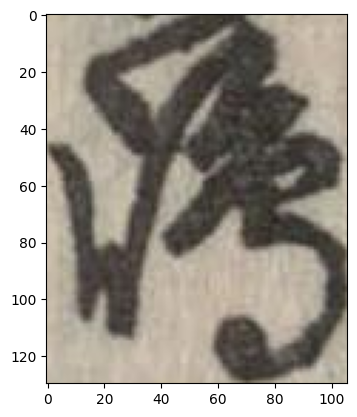

達


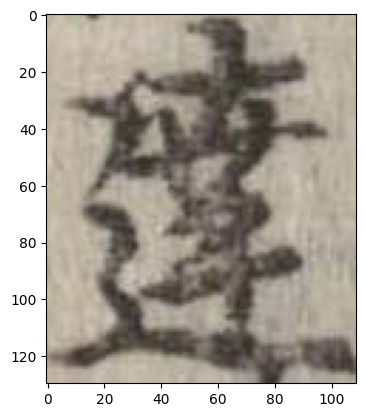

も


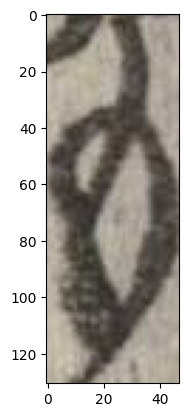

役


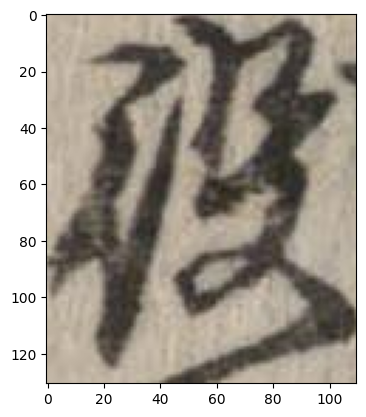

若


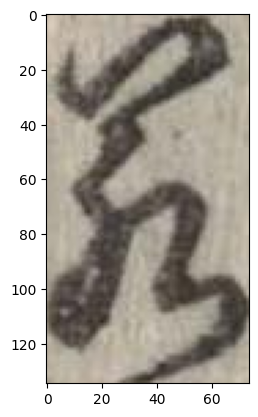

夫


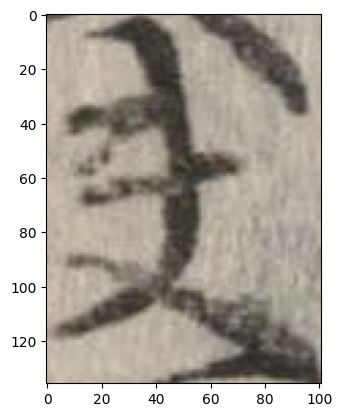

梅


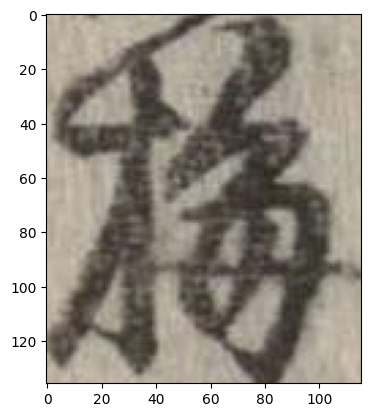

嬉


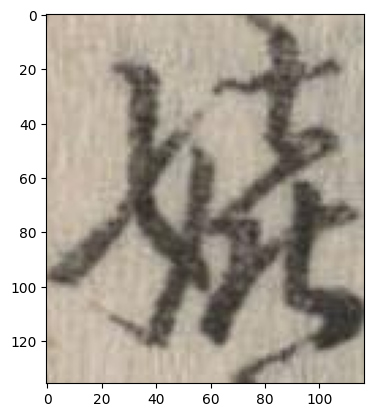

茶


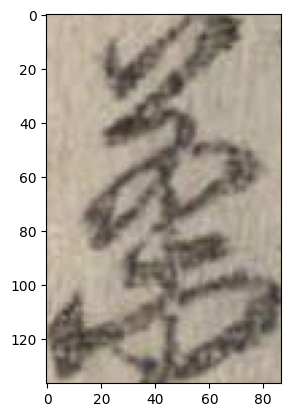

髪


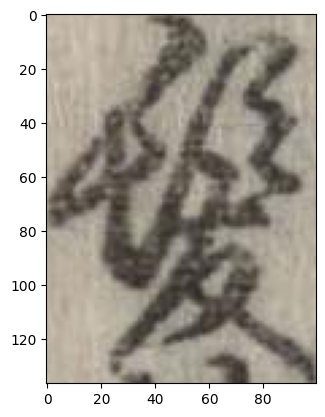

達


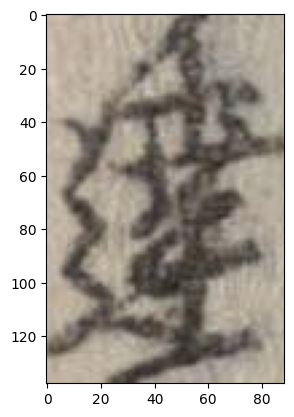

大


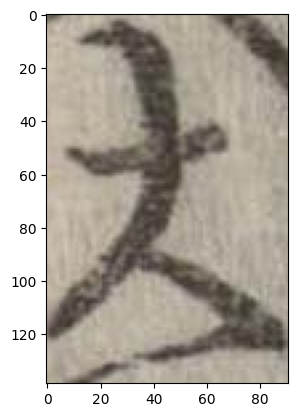

行


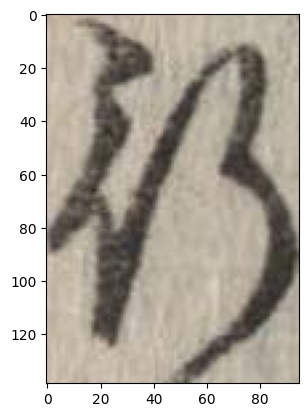

自


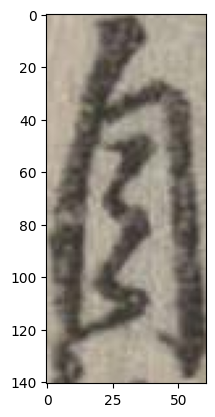

月


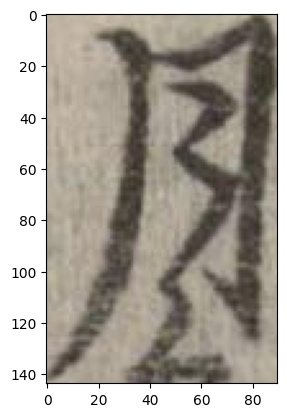

番


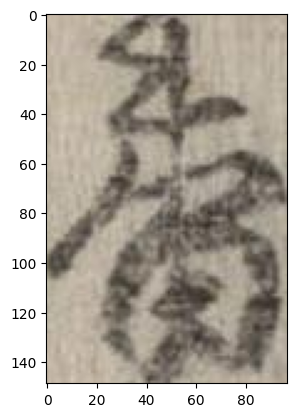

参


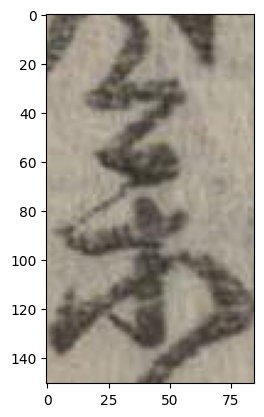

気


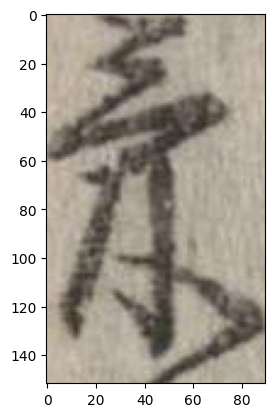

違


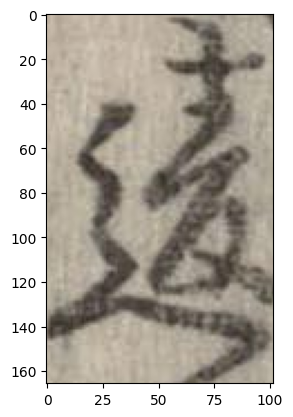

気


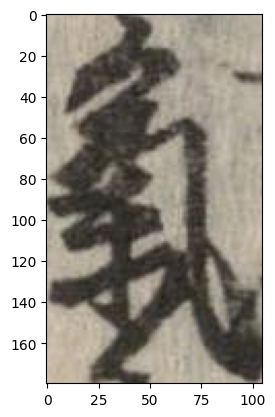

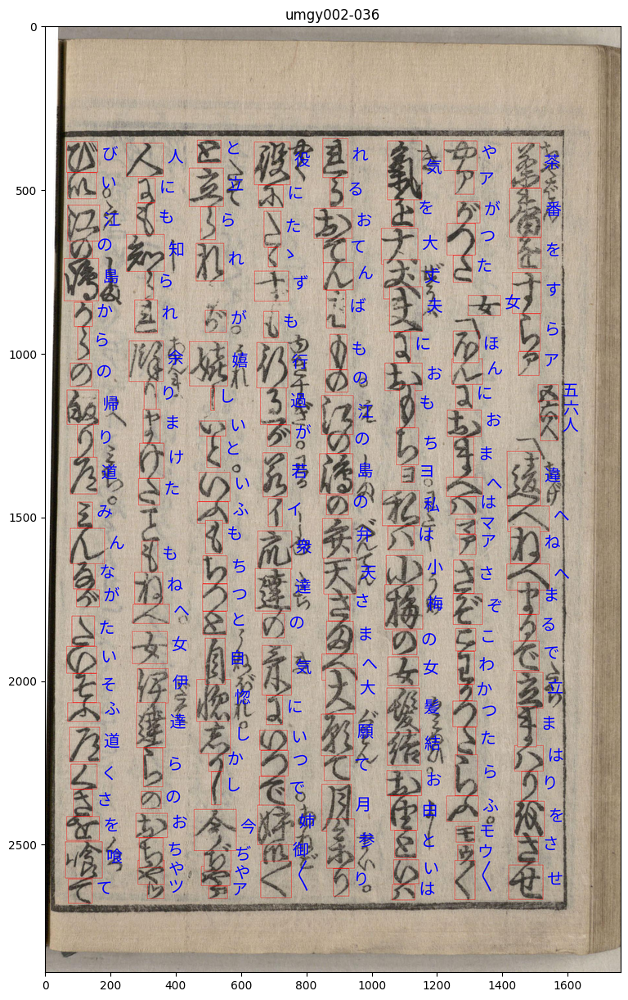

In [6]:
np.random.seed(1337)
for i in range(1):
    img, labels = df_train.values[np.random.randint(len(df_train))]
    viz = visualize_training_data('train_images/{}.jpg'.format(img), labels)
    
    plt.figure(figsize=(15, 15))
    plt.title(img)
    plt.imshow(viz, interpolation='lanczos')
    plt.show()

In [7]:
def preprocessImage(image):
    ret,th1 = cv2.threshold(image,155,255,cv2.THRESH_BINARY)
    return th1

In [8]:
def Extract_Data():
    X_=[]
    y_=[]
   
    for img, labels in tqdm(df_train[:420].values):
        try:
            image_fn = 'train_images/{}.jpg'.format(img)
            labels = np.array(labels.split(' ')).reshape(-1, 5)
            # Read image
            imsource = Image.open(image_fn).convert('RGBA')
            bbox_canvas = Image.new('RGBA', imsource.size)
            char_canvas = Image.new('RGBA', imsource.size)
            bbox_draw = ImageDraw.Draw(bbox_canvas)
            char_draw = ImageDraw.Draw(char_canvas)

            for codepoint, x, y, w, h in labels:
                x, y, w, h = int(x), int(y), int(w), int(h)
                char = unicode_map[codepoint] 
                Croped_image = imsource.crop((x, y, x+w, y+h))
                image = Croped_image.resize((300,300))
                image = np.asarray(image)
                image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
                ret,th1 = cv2.threshold(image,155,255,cv2.THRESH_BINARY_INV)
                X_.append(th1)
                y_.append(str(unicode_map[codepoint]))
        except:
            pass
    X_ = np.array(X_)
    y_ = np.array(y_)

    return X_,y_

In [9]:
x, y = Extract_Data()

100%|██████████| 420/420 [00:51<00:00,  8.21it/s]


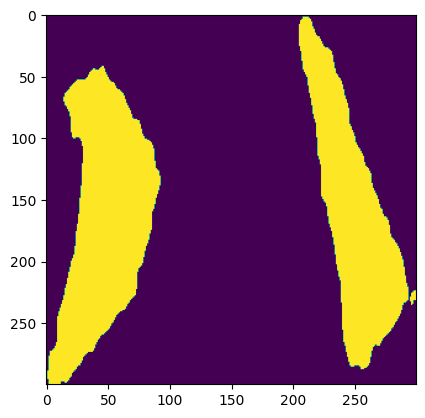

In [10]:
plt.figure()
plt.imshow(x[0])

In [11]:
x.shape

(51840, 300, 300)

In [12]:
unique, counts = np.unique(y, return_counts=True)
print(unique, counts )

['?' '▲' '○' ... '鼎' '鼻' '蓮'] [  1  54 198 ...   6   1   1]


In [13]:
NoOfClasses = len(unique)
NoOfClasses

1465

In [14]:
IMG_ROWS=300
IMG_COLS=300
def PreProcessData(X,y):
    lb = LabelEncoder()
    y_integer = lb.fit_transform(y)
    out_y = np_utils.to_categorical(y_integer)
    num_images = X.shape[0]
    out_x = X.reshape(num_images, IMG_ROWS, IMG_COLS, 1)
    #out_x = x_shaped_array / 255
    return out_x, out_y

In [15]:
lb = LabelEncoder()
y_integer = lb.fit_transform(y)

In [16]:
x_processed, y_processed = PreProcessData(x,y)

In [17]:
X_train, X_val, y_train, y_val = train_test_split(x_processed, y_processed, random_state=42, test_size=0.2)

In [18]:
def kuzushiji_classifier(input):
    model = tf.keras.layers.Conv2D(32, kernel_size=(3, 3),activation='relu', padding='same')(input)
    model = tf.keras.layers.BatchNormalization()(model)
    model = tf.keras.layers.Conv2D(32, kernel_size=(3, 3),activation='relu', padding='same')(model)
    model = tf.keras.layers.BatchNormalization()(model)
    model = tf.keras.layers.Conv2D(32, 5, strides=2, padding='same', activation='relu')(model)
    model = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(model)
    model = tf.keras.layers.BatchNormalization()(model)
    model = tf.keras.layers.Dropout(0.4)(model)
    model = tf.keras.layers.Conv2D(64, kernel_size=(3, 3),strides=2, activation='relu', padding='same')(model)
    model = tf.keras.layers.MaxPooling2D(pool_size=(2, 2))(model)
    model = tf.keras.layers.BatchNormalization()(model)
    model = tf.keras.layers.Conv2D(64, kernel_size=(3, 3), strides=2, activation='relu', padding='same')(model)
    model = tf.keras.layers.Dropout(0.4)(model)
    model = tf.keras.layers.Flatten()(model)
    model = tf.keras.layers.Dense(128, activation='relu')(model)
    model = tf.keras.layers.Dropout(0.4)(model)
    model = tf.keras.layers.Dense(NoOfClasses, activation='softmax')(model)
    return model

In [19]:
Input_Sample = tf.keras.layers.Input(shape=(300, 300, 1))
Output_ = kuzushiji_classifier(Input_Sample)
Model_Enhancer = tf.keras.models.Model(inputs=Input_Sample, outputs=Output_)

In [20]:
Model_Enhancer.compile(loss = "categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
Model_Enhancer.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 300, 300, 1)]     0         
                                                                 
 conv2d (Conv2D)             (None, 300, 300, 32)      320       
                                                                 
 batch_normalization (BatchN  (None, 300, 300, 32)     128       
 ormalization)                                                   
                                                                 
 conv2d_1 (Conv2D)           (None, 300, 300, 32)      9248      
                                                                 
 batch_normalization_1 (Batc  (None, 300, 300, 32)     128       
 hNormalization)                                                 
                                                                 
 conv2d_2 (Conv2D)           (None, 150, 150, 32)      25632 

In [21]:
checkpointer = tf.keras.callbacks.ModelCheckpoint('model_Kuzushiji.h5', verbose=1,mode='auto', monitor='val_acc',save_best_only=True)

In [22]:
history = Model_Enhancer.fit(X_train[0:10000], y_train[0:10000], batch_size=32, epochs=50, verbose=1, validation_data=(X_val, y_val), callbacks=[checkpointer])

Epoch 1/50
313/313 [==============================] - 53s 158ms/step - loss: 4.6126 - accuracy: 0.2171 - val_loss: 3.6051 - val_accuracy: 0.3774
Epoch 2/50
313/313 [==============================] - 48s 153ms/step - loss: 3.4605 - accuracy: 0.3561 - val_loss: 3.0068 - val_accuracy: 0.4706
Epoch 3/50
313/313 [==============================] - 48s 154ms/step - loss: 2.9413 - accuracy: 0.4252 - val_loss: 2.6707 - val_accuracy: 0.5323
Epoch 4/50
313/313 [==============================] - 48s 153ms/step - loss: 2.6079 - accuracy: 0.4658 - val_loss: 2.5094 - val_accuracy: 0.5737
Epoch 5/50
313/313 [==============================] - 48s 153ms/step - loss: 2.3540 - accuracy: 0.5078 - val_loss: 2.4210 - val_accuracy: 0.5941
Epoch 6/50
313/313 [==============================] - 48s 154ms/step - loss: 2.1426 - accuracy: 0.5382 - val_loss: 2.4021 - val_accuracy: 0.6057
Epoch 7/50
313/313 [==============================] - 48s 153ms/step - loss: 1.9686 - accuracy: 0.5681 - val_loss: 2.2702 - val_ac

Text(0.5, 1.0, 'Loss Curves')

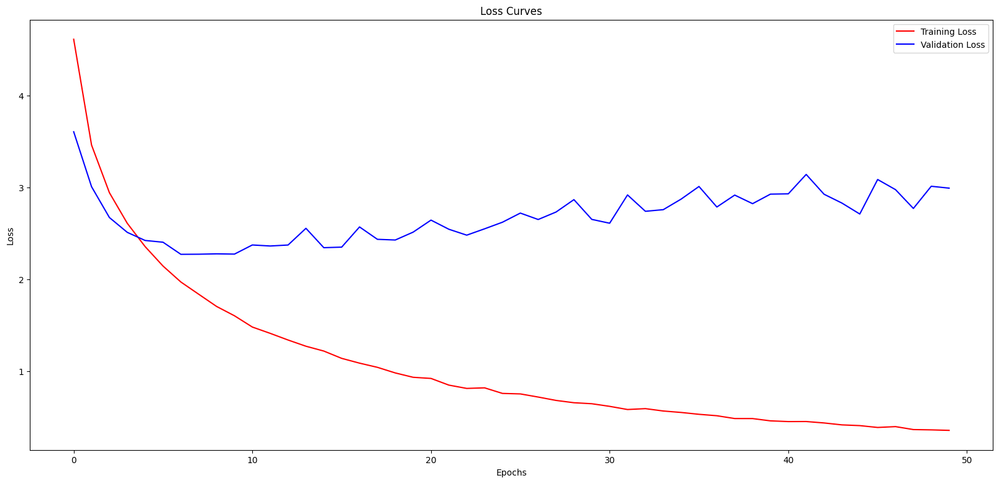

In [23]:
plt.figure(figsize=[20,9])
plt.plot(history.history['loss'], 'r')
plt.plot(history.history['val_loss'], 'b')
plt.legend(['Training Loss','Validation Loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Curves')

Text(0.5, 1.0, 'Accuracy Curves')

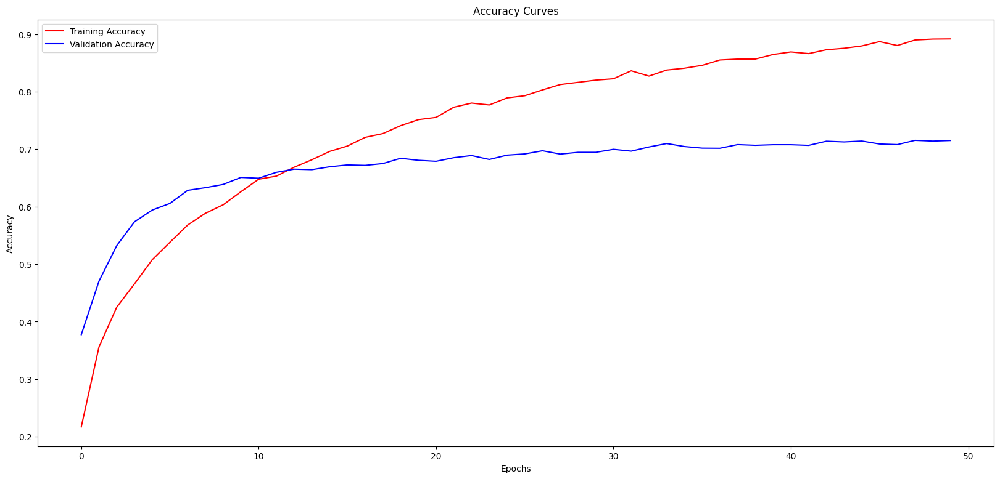

In [27]:
plt.figure(figsize=[20,9])
plt.plot(history.history['accuracy'], 'r')
plt.plot(history.history['val_accuracy'], 'b')
plt.legend(['Training Accuracy','Validation Accuracy'])
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy Curves')

In [28]:
# save model
Model_Enhancer.save('model_Kuzushiji.h5')

In [30]:
model = tf.keras.models.load_model('model_Kuzushiji.h5')

In [31]:
def VisualizeKuzushiji(imagePath):
    img = cv2.imread(imagePath)
    imsource = Image.open(imagePath)
    char_draw = ImageDraw.Draw(imsource)
    im_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, im_th = cv2.threshold(im_grey, 130, 255, cv2.THRESH_BINARY_INV)
    ctrs,_ = cv2.findContours(im_th.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    rects = [cv2.boundingRect(ctr) for ctr in ctrs]
    Kuzushijis = []
    for rect in rects:
        leng = int(rect[3] * 1.6)
        pt1 = int(rect[1] + rect[3]//2 - leng// 2)
        pt2 = int(rect[0] + rect[2]//2 - leng// 2)
        roi = im_th[pt1:pt1+leng, pt2:pt2+leng]
        if roi.size>7000:
            cv2.rectangle(img, (rect[0], rect[1]), (rect[0] + rect[2], rect[1] + rect[3]), (225, 0, 0), 6)
            roi = cv2.resize(roi, (300,300))
            ret,th1 = cv2.threshold(roi,155,255,cv2.THRESH_BINARY)
            ProcessImage = th1.reshape(1,IMG_ROWS, IMG_COLS, 1)
            y_pred = model.predict(ProcessImage)
            y_true = np.argmax(y_pred,axis=1)
            Kuzushiji = lb.inverse_transform(y_true)
            Kuzushijis.append(str(Kuzushiji[0]))
            char_draw.text((rect[0]+10, rect[1]),str(Kuzushiji[0]), fill=(0,22,225,0), font=font)
    return img,imsource

1/1 [==============================] - 0s 11ms/step


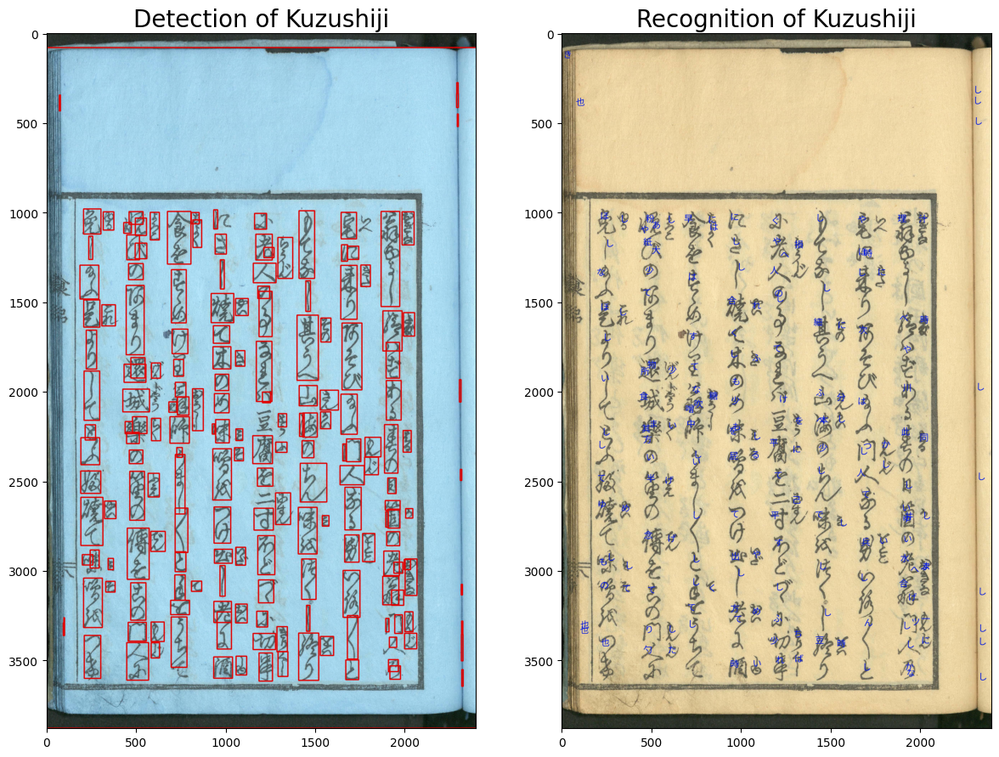

In [33]:
img1, imsource1 = VisualizeKuzushiji('train_images/100241706_00014_2.jpg')
plt.figure(figsize=(30,30))
plt.subplot(1,4,1)
plt.title("Detection of Kuzushiji",fontsize=20)
plt.imshow(img1)
plt.subplot(1,4,2)
plt.title("Recognition of Kuzushiji",fontsize=20)
plt.imshow(imsource1)

1/1 [==============================] - 0s 11ms/step


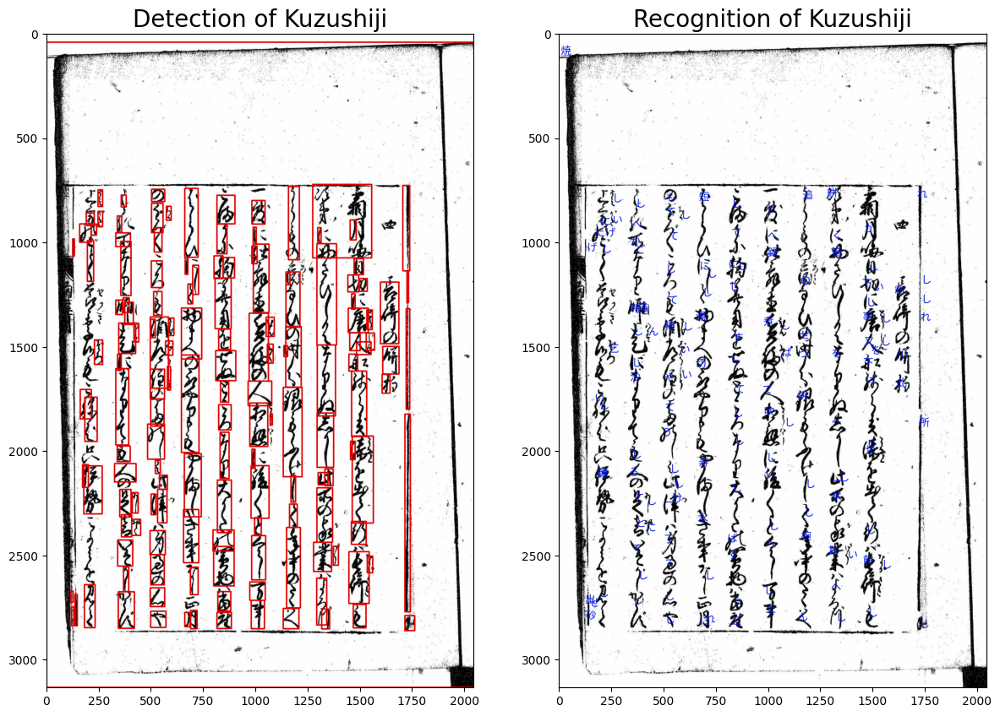

In [34]:
img2, imsource2 = VisualizeKuzushiji('test_images/test_001c37e2.jpg')
plt.figure(figsize=(30,30))
plt.subplot(1,4,1)
plt.title("Detection of Kuzushiji",fontsize=20)
plt.imshow(img2)
plt.subplot(1,4,2)
plt.title("Recognition of Kuzushiji",fontsize=20)
plt.imshow(imsource2)